# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0K/60.0K [00:05<00:00, 10.5KFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

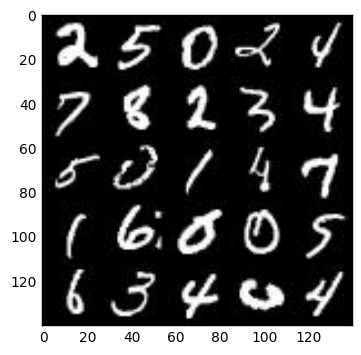

In [6]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

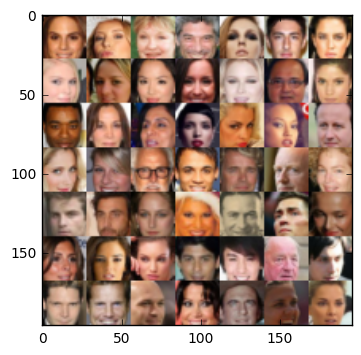

In [13]:
show_n_images = 50

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [14]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0


/home/kapy/anaconda3/envs/dlnd-tf-lab/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [19]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    inputs_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    lr = tf.placeholder(tf.float32, shape=(), name="learning_rate")

    return inputs_real, inputs_z, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [200]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28x3
        x1 = tf.layers.conv2d(images, 128, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        #14x14x128
        
        x2 = tf.layers.conv2d(relu1, 256, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x256
        
        x3 = tf.layers.conv2d(relu1, 512, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 7x7x512

        # Flatten it
        flat = tf.reshape(relu3, (-1, 7*7*512))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [201]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    alpha = 0.2
    with tf.variable_scope('generator', reuse=not is_train):
        # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        #7x7x512
        
        x2 = tf.reshape(x1, (-1, 7, 7, 256))
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        #7x7x256
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        # 14*14*128
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same')
        # 28x28x3
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [202]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    #d_loss_real = tf.reduce_mean(
    #    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    smooth = 0.1
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, 
                                                labels=tf.ones_like(d_model_real) * (1 - smooth)))

    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [203]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
    
    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [204]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [212]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    #tf.reset_default_graph()
    #print(data_shape)
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    #print(input_real)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    step = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                step += 1

                batch_images = batch_images*2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if step % 100 == 0:
                    show_generator_output(sess, 10, input_z, data_shape[3], data_image_mode)
                    
                # At the end of each epoch, get the losses and print them out
                train_loss_d = sess.run(d_loss, {input_z: batch_z, input_real: batch_images})
                train_loss_g = g_loss.eval({input_z: batch_z})
            
                print("Epoch {}/{}...".format(epoch_i+1, epochs),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 3.9625... Generator Loss: 0.0394
Epoch 1/2... Discriminator Loss: 2.3106... Generator Loss: 0.1704
Epoch 1/2... Discriminator Loss: 1.8175... Generator Loss: 0.3630
Epoch 1/2... Discriminator Loss: 1.7323... Generator Loss: 0.3166
Epoch 1/2... Discriminator Loss: 1.1075... Generator Loss: 0.7090
Epoch 1/2... Discriminator Loss: 1.4501... Generator Loss: 0.4444
Epoch 1/2... Discriminator Loss: 0.9740... Generator Loss: 0.8483
Epoch 1/2... Discriminator Loss: 1.0565... Generator Loss: 0.7481
Epoch 1/2... Discriminator Loss: 1.1590... Generator Loss: 0.6658
Epoch 1/2... Discriminator Loss: 0.9354... Generator Loss: 1.2594
Epoch 1/2... Discriminator Loss: 2.4686... Generator Loss: 0.1608
Epoch 1/2... Discriminator Loss: 1.3148... Generator Loss: 0.7068
Epoch 1/2... Discriminator Loss: 1.3562... Generator Loss: 0.5847
Epoch 1/2... Discriminator Loss: 1.3490... Generator Loss: 0.6071
Epoch 1/2... Discriminator Loss: 1.7649... Generator Loss: 0.4285
Epoch 1/2.

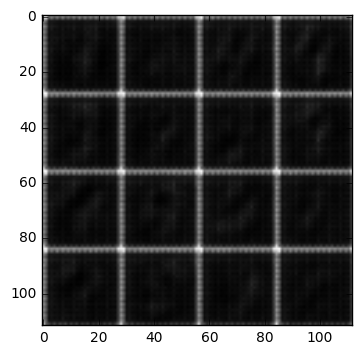

Epoch 1/2... Discriminator Loss: 1.7633... Generator Loss: 0.4937
Epoch 1/2... Discriminator Loss: 1.2241... Generator Loss: 1.0168
Epoch 1/2... Discriminator Loss: 1.4009... Generator Loss: 0.6581
Epoch 1/2... Discriminator Loss: 1.0440... Generator Loss: 1.4601
Epoch 1/2... Discriminator Loss: 1.9043... Generator Loss: 0.3166
Epoch 1/2... Discriminator Loss: 1.1536... Generator Loss: 1.6403
Epoch 1/2... Discriminator Loss: 1.4235... Generator Loss: 0.5295
Epoch 1/2... Discriminator Loss: 1.7150... Generator Loss: 0.3691
Epoch 1/2... Discriminator Loss: 1.7043... Generator Loss: 2.5315
Epoch 1/2... Discriminator Loss: 1.8494... Generator Loss: 0.3526
Epoch 1/2... Discriminator Loss: 1.1363... Generator Loss: 0.9030
Epoch 1/2... Discriminator Loss: 1.4261... Generator Loss: 0.6838
Epoch 1/2... Discriminator Loss: 1.4310... Generator Loss: 0.6139
Epoch 1/2... Discriminator Loss: 1.0267... Generator Loss: 1.3615
Epoch 1/2... Discriminator Loss: 1.6900... Generator Loss: 0.3813
Epoch 1/2.

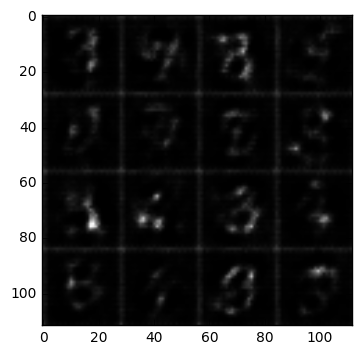

Epoch 1/2... Discriminator Loss: 1.5436... Generator Loss: 0.5753
Epoch 1/2... Discriminator Loss: 1.3798... Generator Loss: 0.6662
Epoch 1/2... Discriminator Loss: 1.2480... Generator Loss: 0.7509
Epoch 1/2... Discriminator Loss: 1.3008... Generator Loss: 0.6264
Epoch 1/2... Discriminator Loss: 1.5175... Generator Loss: 0.4987
Epoch 1/2... Discriminator Loss: 1.4211... Generator Loss: 1.2198
Epoch 1/2... Discriminator Loss: 1.1689... Generator Loss: 0.8010
Epoch 1/2... Discriminator Loss: 1.2964... Generator Loss: 0.6912
Epoch 1/2... Discriminator Loss: 1.6000... Generator Loss: 0.4406
Epoch 1/2... Discriminator Loss: 1.5060... Generator Loss: 1.3864
Epoch 1/2... Discriminator Loss: 1.6846... Generator Loss: 0.3866
Epoch 1/2... Discriminator Loss: 1.2687... Generator Loss: 1.3698
Epoch 1/2... Discriminator Loss: 1.3088... Generator Loss: 0.6783
Epoch 1/2... Discriminator Loss: 1.3772... Generator Loss: 0.6275
Epoch 1/2... Discriminator Loss: 1.1513... Generator Loss: 1.2732
Epoch 1/2.

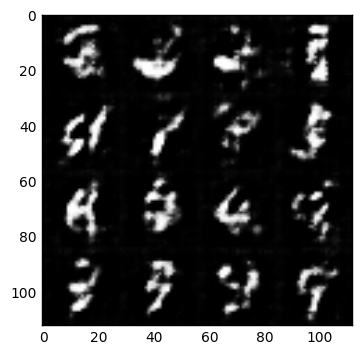

Epoch 1/2... Discriminator Loss: 1.2311... Generator Loss: 0.9955
Epoch 1/2... Discriminator Loss: 1.3456... Generator Loss: 0.5537
Epoch 1/2... Discriminator Loss: 1.1398... Generator Loss: 1.1122
Epoch 1/2... Discriminator Loss: 1.1319... Generator Loss: 0.7948
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.6987
Epoch 1/2... Discriminator Loss: 1.1449... Generator Loss: 1.0575
Epoch 1/2... Discriminator Loss: 1.1692... Generator Loss: 0.7280
Epoch 1/2... Discriminator Loss: 1.1788... Generator Loss: 0.8749
Epoch 1/2... Discriminator Loss: 1.3606... Generator Loss: 0.5546
Epoch 1/2... Discriminator Loss: 1.2575... Generator Loss: 1.7140
Epoch 1/2... Discriminator Loss: 1.4103... Generator Loss: 0.5133
Epoch 1/2... Discriminator Loss: 1.0055... Generator Loss: 1.1775
Epoch 1/2... Discriminator Loss: 1.3467... Generator Loss: 0.5628
Epoch 1/2... Discriminator Loss: 1.1511... Generator Loss: 1.2841
Epoch 1/2... Discriminator Loss: 1.0306... Generator Loss: 0.9143
Epoch 1/2.

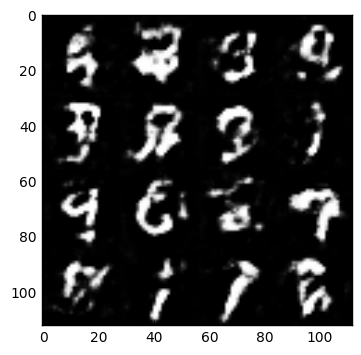

Epoch 1/2... Discriminator Loss: 1.2180... Generator Loss: 0.7415
Epoch 1/2... Discriminator Loss: 0.9575... Generator Loss: 1.3106
Epoch 1/2... Discriminator Loss: 1.6250... Generator Loss: 0.4154
Epoch 1/2... Discriminator Loss: 1.2410... Generator Loss: 0.8390
Epoch 1/2... Discriminator Loss: 0.9253... Generator Loss: 1.4531
Epoch 1/2... Discriminator Loss: 1.3869... Generator Loss: 0.5269
Epoch 1/2... Discriminator Loss: 1.2157... Generator Loss: 1.0563
Epoch 1/2... Discriminator Loss: 0.9732... Generator Loss: 1.0050
Epoch 1/2... Discriminator Loss: 1.4228... Generator Loss: 0.4747
Epoch 1/2... Discriminator Loss: 1.0900... Generator Loss: 1.2563
Epoch 1/2... Discriminator Loss: 1.4155... Generator Loss: 0.5252
Epoch 1/2... Discriminator Loss: 0.9929... Generator Loss: 1.7500
Epoch 1/2... Discriminator Loss: 1.5344... Generator Loss: 0.4576
Epoch 1/2... Discriminator Loss: 1.0669... Generator Loss: 1.2691
Epoch 1/2... Discriminator Loss: 1.2031... Generator Loss: 0.6958
Epoch 1/2.

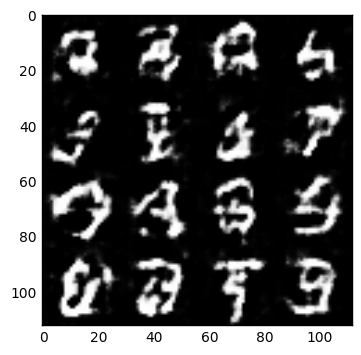

Epoch 1/2... Discriminator Loss: 1.0808... Generator Loss: 1.5329
Epoch 1/2... Discriminator Loss: 1.3042... Generator Loss: 0.6709
Epoch 1/2... Discriminator Loss: 0.9977... Generator Loss: 1.1437
Epoch 1/2... Discriminator Loss: 1.0659... Generator Loss: 0.8802
Epoch 1/2... Discriminator Loss: 1.1781... Generator Loss: 0.9551
Epoch 1/2... Discriminator Loss: 1.0176... Generator Loss: 1.0624
Epoch 1/2... Discriminator Loss: 1.2232... Generator Loss: 0.7176
Epoch 1/2... Discriminator Loss: 1.0022... Generator Loss: 1.3179
Epoch 1/2... Discriminator Loss: 0.8595... Generator Loss: 1.1508
Epoch 1/2... Discriminator Loss: 0.8852... Generator Loss: 1.1079
Epoch 1/2... Discriminator Loss: 1.2393... Generator Loss: 0.6671
Epoch 1/2... Discriminator Loss: 1.0904... Generator Loss: 0.9379
Epoch 1/2... Discriminator Loss: 0.9762... Generator Loss: 1.1996
Epoch 1/2... Discriminator Loss: 1.2976... Generator Loss: 0.5644
Epoch 1/2... Discriminator Loss: 1.1348... Generator Loss: 1.2187
Epoch 1/2.

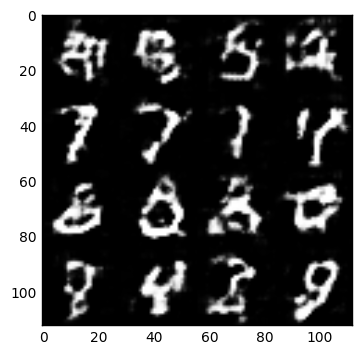

Epoch 1/2... Discriminator Loss: 0.9610... Generator Loss: 1.2657
Epoch 1/2... Discriminator Loss: 1.5485... Generator Loss: 0.4685
Epoch 1/2... Discriminator Loss: 1.3357... Generator Loss: 1.1593
Epoch 1/2... Discriminator Loss: 0.9506... Generator Loss: 1.2515
Epoch 1/2... Discriminator Loss: 1.2969... Generator Loss: 0.5883
Epoch 1/2... Discriminator Loss: 0.9880... Generator Loss: 1.2984
Epoch 1/2... Discriminator Loss: 1.5347... Generator Loss: 0.4187
Epoch 1/2... Discriminator Loss: 1.2328... Generator Loss: 1.6114
Epoch 1/2... Discriminator Loss: 1.6189... Generator Loss: 0.4658
Epoch 1/2... Discriminator Loss: 1.0789... Generator Loss: 1.5534
Epoch 1/2... Discriminator Loss: 1.0964... Generator Loss: 0.9768
Epoch 1/2... Discriminator Loss: 1.5169... Generator Loss: 0.4801
Epoch 1/2... Discriminator Loss: 1.1243... Generator Loss: 1.0865
Epoch 1/2... Discriminator Loss: 1.2306... Generator Loss: 0.7869
Epoch 1/2... Discriminator Loss: 1.1528... Generator Loss: 0.8070
Epoch 1/2.

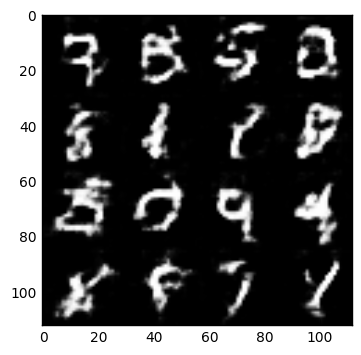

Epoch 1/2... Discriminator Loss: 0.9456... Generator Loss: 1.0584
Epoch 1/2... Discriminator Loss: 1.1437... Generator Loss: 0.7368
Epoch 1/2... Discriminator Loss: 1.3874... Generator Loss: 0.5646
Epoch 1/2... Discriminator Loss: 1.2041... Generator Loss: 1.8300
Epoch 1/2... Discriminator Loss: 1.4725... Generator Loss: 0.4704
Epoch 1/2... Discriminator Loss: 1.1777... Generator Loss: 1.3057
Epoch 1/2... Discriminator Loss: 1.2531... Generator Loss: 0.7872
Epoch 1/2... Discriminator Loss: 1.1864... Generator Loss: 0.7285
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 1.3049
Epoch 1/2... Discriminator Loss: 1.2078... Generator Loss: 0.6752
Epoch 1/2... Discriminator Loss: 1.0380... Generator Loss: 1.1107
Epoch 1/2... Discriminator Loss: 0.9650... Generator Loss: 1.0645
Epoch 1/2... Discriminator Loss: 1.1281... Generator Loss: 0.8121
Epoch 1/2... Discriminator Loss: 0.9841... Generator Loss: 1.4054
Epoch 1/2... Discriminator Loss: 0.8632... Generator Loss: 1.0909
Epoch 1/2.

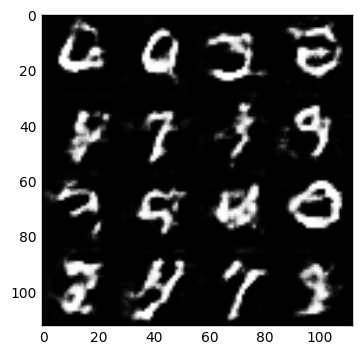

Epoch 1/2... Discriminator Loss: 1.1979... Generator Loss: 0.8084
Epoch 1/2... Discriminator Loss: 1.0645... Generator Loss: 1.2667
Epoch 1/2... Discriminator Loss: 1.1990... Generator Loss: 0.7347
Epoch 1/2... Discriminator Loss: 1.3076... Generator Loss: 0.7019
Epoch 1/2... Discriminator Loss: 1.0814... Generator Loss: 1.0738
Epoch 1/2... Discriminator Loss: 1.2457... Generator Loss: 0.6227
Epoch 1/2... Discriminator Loss: 1.2090... Generator Loss: 0.7560
Epoch 1/2... Discriminator Loss: 1.0266... Generator Loss: 1.9529
Epoch 1/2... Discriminator Loss: 0.9362... Generator Loss: 1.0469
Epoch 1/2... Discriminator Loss: 1.3518... Generator Loss: 0.5617
Epoch 1/2... Discriminator Loss: 1.3043... Generator Loss: 1.0004
Epoch 1/2... Discriminator Loss: 1.2763... Generator Loss: 0.6942
Epoch 1/2... Discriminator Loss: 1.2204... Generator Loss: 0.6959
Epoch 1/2... Discriminator Loss: 1.0915... Generator Loss: 1.0853
Epoch 1/2... Discriminator Loss: 1.2447... Generator Loss: 0.6480
Epoch 1/2.

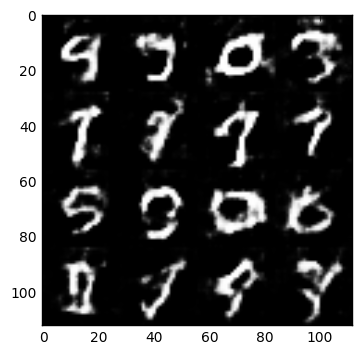

Epoch 1/2... Discriminator Loss: 1.2709... Generator Loss: 0.9259
Epoch 1/2... Discriminator Loss: 1.0784... Generator Loss: 0.9090
Epoch 1/2... Discriminator Loss: 1.4193... Generator Loss: 0.5266
Epoch 1/2... Discriminator Loss: 1.1739... Generator Loss: 1.3520
Epoch 1/2... Discriminator Loss: 1.4693... Generator Loss: 0.4967
Epoch 1/2... Discriminator Loss: 1.1877... Generator Loss: 1.1243
Epoch 1/2... Discriminator Loss: 1.0840... Generator Loss: 0.9157
Epoch 1/2... Discriminator Loss: 1.0287... Generator Loss: 0.8819
Epoch 1/2... Discriminator Loss: 1.1568... Generator Loss: 0.9165
Epoch 1/2... Discriminator Loss: 1.3295... Generator Loss: 0.5974
Epoch 1/2... Discriminator Loss: 1.1546... Generator Loss: 0.9219
Epoch 1/2... Discriminator Loss: 0.9415... Generator Loss: 1.5596
Epoch 1/2... Discriminator Loss: 1.4879... Generator Loss: 0.5221
Epoch 1/2... Discriminator Loss: 1.2153... Generator Loss: 0.8987
Epoch 1/2... Discriminator Loss: 0.9477... Generator Loss: 1.0999
Epoch 1/2.

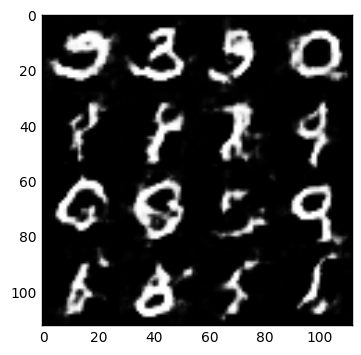

Epoch 1/2... Discriminator Loss: 1.3561... Generator Loss: 1.5051
Epoch 1/2... Discriminator Loss: 0.9063... Generator Loss: 1.2916
Epoch 1/2... Discriminator Loss: 1.5202... Generator Loss: 0.4403
Epoch 1/2... Discriminator Loss: 1.2266... Generator Loss: 1.3496
Epoch 1/2... Discriminator Loss: 1.4073... Generator Loss: 0.5311
Epoch 1/2... Discriminator Loss: 0.9756... Generator Loss: 1.3986
Epoch 1/2... Discriminator Loss: 1.0549... Generator Loss: 0.9597
Epoch 1/2... Discriminator Loss: 1.2706... Generator Loss: 0.6916
Epoch 1/2... Discriminator Loss: 1.2727... Generator Loss: 0.7457
Epoch 1/2... Discriminator Loss: 1.3483... Generator Loss: 0.7079
Epoch 1/2... Discriminator Loss: 0.9979... Generator Loss: 1.4170
Epoch 1/2... Discriminator Loss: 1.4106... Generator Loss: 0.5555
Epoch 1/2... Discriminator Loss: 1.0805... Generator Loss: 1.0188
Epoch 1/2... Discriminator Loss: 1.2671... Generator Loss: 0.6000
Epoch 1/2... Discriminator Loss: 0.9771... Generator Loss: 1.2507
Epoch 1/2.

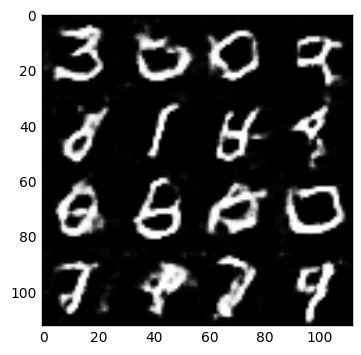

Epoch 1/2... Discriminator Loss: 1.3595... Generator Loss: 0.5503
Epoch 1/2... Discriminator Loss: 1.0859... Generator Loss: 1.3311
Epoch 1/2... Discriminator Loss: 1.3888... Generator Loss: 0.5750
Epoch 1/2... Discriminator Loss: 1.2286... Generator Loss: 0.7509
Epoch 1/2... Discriminator Loss: 1.0173... Generator Loss: 1.0913
Epoch 1/2... Discriminator Loss: 1.0998... Generator Loss: 0.8541
Epoch 1/2... Discriminator Loss: 1.2126... Generator Loss: 0.8512
Epoch 1/2... Discriminator Loss: 1.1293... Generator Loss: 0.7886
Epoch 1/2... Discriminator Loss: 0.9282... Generator Loss: 1.1234
Epoch 1/2... Discriminator Loss: 1.0400... Generator Loss: 1.0377
Epoch 1/2... Discriminator Loss: 1.0406... Generator Loss: 0.7987
Epoch 1/2... Discriminator Loss: 0.9872... Generator Loss: 1.1999
Epoch 1/2... Discriminator Loss: 0.8803... Generator Loss: 1.3465
Epoch 1/2... Discriminator Loss: 1.1556... Generator Loss: 0.7063
Epoch 1/2... Discriminator Loss: 1.3741... Generator Loss: 0.5165
Epoch 1/2.

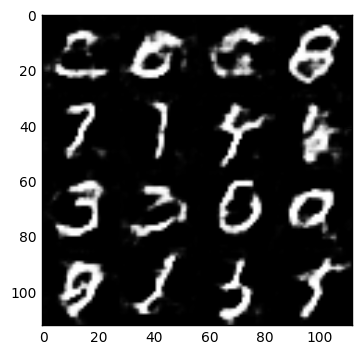

Epoch 1/2... Discriminator Loss: 1.0965... Generator Loss: 0.8365
Epoch 1/2... Discriminator Loss: 1.2572... Generator Loss: 0.6375
Epoch 1/2... Discriminator Loss: 1.1345... Generator Loss: 0.9117
Epoch 1/2... Discriminator Loss: 1.2062... Generator Loss: 0.8138
Epoch 1/2... Discriminator Loss: 1.2462... Generator Loss: 0.8599
Epoch 1/2... Discriminator Loss: 1.0930... Generator Loss: 0.9446
Epoch 1/2... Discriminator Loss: 1.0472... Generator Loss: 1.0112
Epoch 1/2... Discriminator Loss: 1.1664... Generator Loss: 0.7929
Epoch 1/2... Discriminator Loss: 0.9487... Generator Loss: 1.1623
Epoch 1/2... Discriminator Loss: 0.9580... Generator Loss: 0.9485
Epoch 1/2... Discriminator Loss: 1.3790... Generator Loss: 0.5179
Epoch 1/2... Discriminator Loss: 1.1412... Generator Loss: 1.2214
Epoch 1/2... Discriminator Loss: 1.1816... Generator Loss: 0.7325
Epoch 1/2... Discriminator Loss: 1.0388... Generator Loss: 0.9495
Epoch 1/2... Discriminator Loss: 0.9844... Generator Loss: 1.0233
Epoch 1/2.

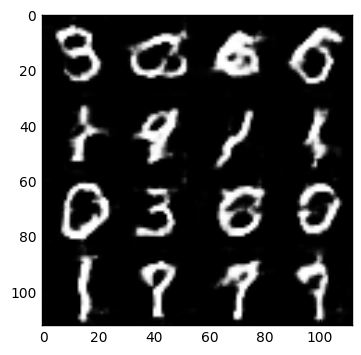

Epoch 1/2... Discriminator Loss: 1.2026... Generator Loss: 0.6763
Epoch 1/2... Discriminator Loss: 0.9833... Generator Loss: 0.9996
Epoch 1/2... Discriminator Loss: 1.0464... Generator Loss: 0.9934
Epoch 1/2... Discriminator Loss: 1.3586... Generator Loss: 0.5352
Epoch 1/2... Discriminator Loss: 1.1095... Generator Loss: 1.3732
Epoch 1/2... Discriminator Loss: 1.0340... Generator Loss: 0.9422
Epoch 1/2... Discriminator Loss: 1.2442... Generator Loss: 0.6844
Epoch 1/2... Discriminator Loss: 1.0847... Generator Loss: 0.9581
Epoch 1/2... Discriminator Loss: 1.2284... Generator Loss: 0.7543
Epoch 1/2... Discriminator Loss: 1.0305... Generator Loss: 1.0631
Epoch 1/2... Discriminator Loss: 1.4385... Generator Loss: 0.4751
Epoch 1/2... Discriminator Loss: 1.2852... Generator Loss: 0.9808
Epoch 1/2... Discriminator Loss: 1.0245... Generator Loss: 1.4038
Epoch 1/2... Discriminator Loss: 1.5556... Generator Loss: 0.4238
Epoch 1/2... Discriminator Loss: 1.1358... Generator Loss: 1.0013
Epoch 1/2.

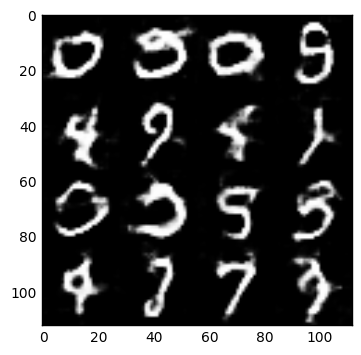

Epoch 1/2... Discriminator Loss: 1.3829... Generator Loss: 0.5688
Epoch 1/2... Discriminator Loss: 1.0658... Generator Loss: 1.4832
Epoch 1/2... Discriminator Loss: 1.5081... Generator Loss: 0.5358
Epoch 1/2... Discriminator Loss: 1.0913... Generator Loss: 1.2606
Epoch 1/2... Discriminator Loss: 1.1221... Generator Loss: 0.8030
Epoch 1/2... Discriminator Loss: 1.2634... Generator Loss: 0.6686
Epoch 1/2... Discriminator Loss: 1.2413... Generator Loss: 2.2189
Epoch 1/2... Discriminator Loss: 1.3978... Generator Loss: 0.6069
Epoch 1/2... Discriminator Loss: 1.1205... Generator Loss: 0.8788
Epoch 1/2... Discriminator Loss: 1.1161... Generator Loss: 0.9660
Epoch 1/2... Discriminator Loss: 1.2110... Generator Loss: 0.9705
Epoch 1/2... Discriminator Loss: 1.2744... Generator Loss: 0.6321
Epoch 1/2... Discriminator Loss: 1.2105... Generator Loss: 1.4320
Epoch 1/2... Discriminator Loss: 1.2633... Generator Loss: 0.6239
Epoch 1/2... Discriminator Loss: 1.3634... Generator Loss: 0.5669
Epoch 1/2.

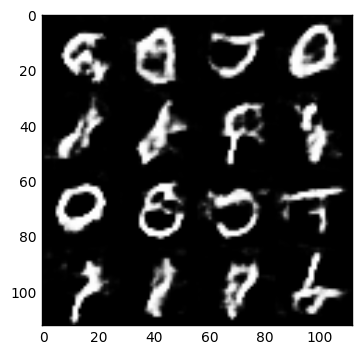

Epoch 1/2... Discriminator Loss: 1.1537... Generator Loss: 0.6977
Epoch 1/2... Discriminator Loss: 1.1377... Generator Loss: 0.8513
Epoch 1/2... Discriminator Loss: 1.0396... Generator Loss: 1.1720
Epoch 1/2... Discriminator Loss: 1.4627... Generator Loss: 0.5211
Epoch 1/2... Discriminator Loss: 1.1118... Generator Loss: 1.0985
Epoch 1/2... Discriminator Loss: 0.8831... Generator Loss: 1.3256
Epoch 1/2... Discriminator Loss: 1.1461... Generator Loss: 0.7388
Epoch 1/2... Discriminator Loss: 1.1861... Generator Loss: 0.8701
Epoch 1/2... Discriminator Loss: 1.0742... Generator Loss: 0.8275
Epoch 1/2... Discriminator Loss: 1.1566... Generator Loss: 0.7358
Epoch 1/2... Discriminator Loss: 1.2059... Generator Loss: 1.6947
Epoch 1/2... Discriminator Loss: 1.2629... Generator Loss: 0.6636
Epoch 1/2... Discriminator Loss: 0.9243... Generator Loss: 1.1593
Epoch 1/2... Discriminator Loss: 0.9861... Generator Loss: 0.8959
Epoch 1/2... Discriminator Loss: 1.2968... Generator Loss: 0.6765
Epoch 1/2.

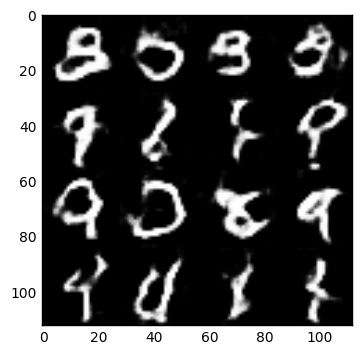

Epoch 1/2... Discriminator Loss: 1.1134... Generator Loss: 1.4781
Epoch 1/2... Discriminator Loss: 1.2837... Generator Loss: 0.6711
Epoch 1/2... Discriminator Loss: 1.1981... Generator Loss: 0.6828
Epoch 1/2... Discriminator Loss: 1.1666... Generator Loss: 1.4194
Epoch 1/2... Discriminator Loss: 1.4156... Generator Loss: 0.4705
Epoch 1/2... Discriminator Loss: 1.0896... Generator Loss: 1.5670
Epoch 1/2... Discriminator Loss: 1.2035... Generator Loss: 0.7843
Epoch 1/2... Discriminator Loss: 1.0167... Generator Loss: 1.1613
Epoch 1/2... Discriminator Loss: 1.1912... Generator Loss: 0.8311
Epoch 1/2... Discriminator Loss: 1.4177... Generator Loss: 0.5111
Epoch 1/2... Discriminator Loss: 1.1596... Generator Loss: 1.8158
Epoch 1/2... Discriminator Loss: 1.3262... Generator Loss: 0.5539
Epoch 1/2... Discriminator Loss: 1.0904... Generator Loss: 0.9951
Epoch 1/2... Discriminator Loss: 1.1445... Generator Loss: 0.9219
Epoch 1/2... Discriminator Loss: 1.0101... Generator Loss: 1.0283
Epoch 1/2.

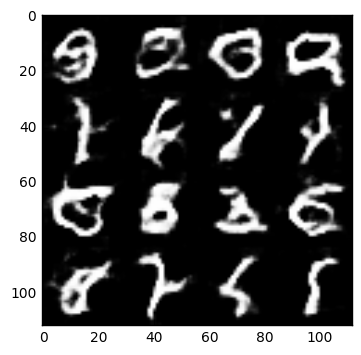

Epoch 1/2... Discriminator Loss: 1.0957... Generator Loss: 0.7952
Epoch 1/2... Discriminator Loss: 1.0725... Generator Loss: 0.8939
Epoch 1/2... Discriminator Loss: 1.0161... Generator Loss: 1.7819
Epoch 1/2... Discriminator Loss: 1.5486... Generator Loss: 0.5024
Epoch 1/2... Discriminator Loss: 1.1173... Generator Loss: 0.8452
Epoch 1/2... Discriminator Loss: 1.0730... Generator Loss: 1.4197
Epoch 1/2... Discriminator Loss: 1.1150... Generator Loss: 0.7823
Epoch 1/2... Discriminator Loss: 0.9920... Generator Loss: 1.0837
Epoch 1/2... Discriminator Loss: 1.3587... Generator Loss: 0.5458
Epoch 1/2... Discriminator Loss: 0.9978... Generator Loss: 1.6259
Epoch 1/2... Discriminator Loss: 1.3127... Generator Loss: 0.6145
Epoch 1/2... Discriminator Loss: 0.9592... Generator Loss: 1.4476
Epoch 1/2... Discriminator Loss: 1.1038... Generator Loss: 0.7958
Epoch 1/2... Discriminator Loss: 1.0602... Generator Loss: 0.9102
Epoch 1/2... Discriminator Loss: 0.9706... Generator Loss: 1.0992
Epoch 1/2.

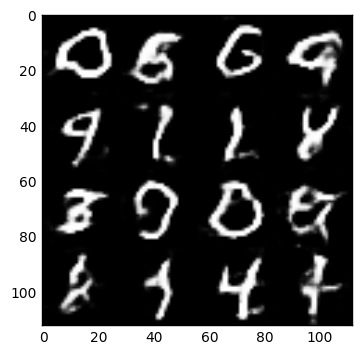

Epoch 1/2... Discriminator Loss: 1.1677... Generator Loss: 0.6779
Epoch 1/2... Discriminator Loss: 1.2984... Generator Loss: 0.5508
Epoch 1/2... Discriminator Loss: 1.2626... Generator Loss: 1.8228
Epoch 1/2... Discriminator Loss: 1.2774... Generator Loss: 0.5952
Epoch 1/2... Discriminator Loss: 1.1325... Generator Loss: 0.9331
Epoch 1/2... Discriminator Loss: 0.9887... Generator Loss: 0.9404
Epoch 1/2... Discriminator Loss: 0.9589... Generator Loss: 1.0197
Epoch 1/2... Discriminator Loss: 1.0533... Generator Loss: 1.0339
Epoch 1/2... Discriminator Loss: 1.0940... Generator Loss: 0.9216
Epoch 1/2... Discriminator Loss: 1.0738... Generator Loss: 0.8887
Epoch 1/2... Discriminator Loss: 0.8557... Generator Loss: 1.4332
Epoch 1/2... Discriminator Loss: 1.4832... Generator Loss: 0.4773
Epoch 1/2... Discriminator Loss: 1.2230... Generator Loss: 1.1362
Epoch 1/2... Discriminator Loss: 0.9875... Generator Loss: 1.0543
Epoch 1/2... Discriminator Loss: 1.4219... Generator Loss: 0.5161
Epoch 1/2.

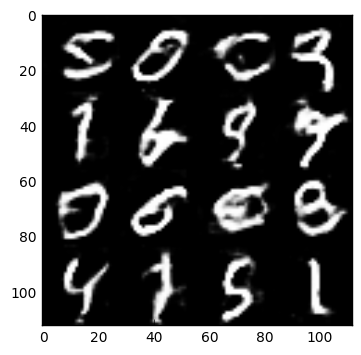

Epoch 1/2... Discriminator Loss: 0.9292... Generator Loss: 1.2416
Epoch 1/2... Discriminator Loss: 1.4552... Generator Loss: 0.4779
Epoch 1/2... Discriminator Loss: 1.0014... Generator Loss: 1.4384
Epoch 1/2... Discriminator Loss: 0.9262... Generator Loss: 1.0015
Epoch 1/2... Discriminator Loss: 1.0640... Generator Loss: 0.8119
Epoch 1/2... Discriminator Loss: 1.1748... Generator Loss: 0.6505
Epoch 1/2... Discriminator Loss: 1.0354... Generator Loss: 1.5290
Epoch 1/2... Discriminator Loss: 1.3383... Generator Loss: 0.5532
Epoch 1/2... Discriminator Loss: 1.0541... Generator Loss: 1.7453
Epoch 1/2... Discriminator Loss: 1.8164... Generator Loss: 0.3286
Epoch 1/2... Discriminator Loss: 0.9937... Generator Loss: 1.9616
Epoch 1/2... Discriminator Loss: 1.0214... Generator Loss: 0.9104
Epoch 1/2... Discriminator Loss: 1.6223... Generator Loss: 0.4517
Epoch 1/2... Discriminator Loss: 1.3496... Generator Loss: 1.0770
Epoch 1/2... Discriminator Loss: 1.0906... Generator Loss: 1.6240
Epoch 1/2.

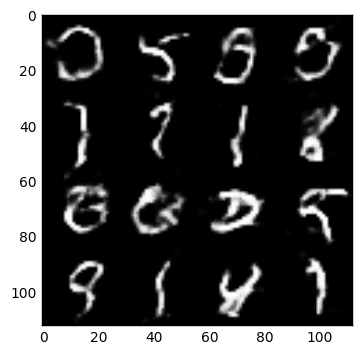

Epoch 1/2... Discriminator Loss: 1.0338... Generator Loss: 0.8538
Epoch 1/2... Discriminator Loss: 0.9588... Generator Loss: 1.3125
Epoch 1/2... Discriminator Loss: 1.5239... Generator Loss: 0.4588
Epoch 1/2... Discriminator Loss: 1.0983... Generator Loss: 1.4999
Epoch 1/2... Discriminator Loss: 1.1372... Generator Loss: 0.8649
Epoch 1/2... Discriminator Loss: 1.2538... Generator Loss: 0.6840
Epoch 1/2... Discriminator Loss: 1.2359... Generator Loss: 0.7538
Epoch 1/2... Discriminator Loss: 1.0143... Generator Loss: 1.0422
Epoch 1/2... Discriminator Loss: 1.2940... Generator Loss: 0.5886
Epoch 1/2... Discriminator Loss: 1.0874... Generator Loss: 1.0938
Epoch 1/2... Discriminator Loss: 0.8959... Generator Loss: 1.1438
Epoch 1/2... Discriminator Loss: 1.1501... Generator Loss: 0.6704
Epoch 1/2... Discriminator Loss: 1.1554... Generator Loss: 0.8373
Epoch 1/2... Discriminator Loss: 0.8857... Generator Loss: 1.3333
Epoch 1/2... Discriminator Loss: 1.3886... Generator Loss: 0.5202
Epoch 1/2.

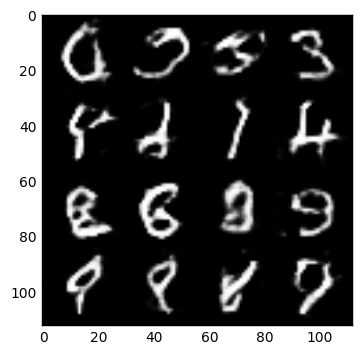

Epoch 1/2... Discriminator Loss: 1.1188... Generator Loss: 0.8206
Epoch 1/2... Discriminator Loss: 1.2376... Generator Loss: 0.8872
Epoch 1/2... Discriminator Loss: 1.0861... Generator Loss: 0.8908
Epoch 1/2... Discriminator Loss: 1.1039... Generator Loss: 0.8438
Epoch 1/2... Discriminator Loss: 0.9034... Generator Loss: 1.2200
Epoch 1/2... Discriminator Loss: 1.3769... Generator Loss: 0.5107
Epoch 1/2... Discriminator Loss: 1.1012... Generator Loss: 1.8774
Epoch 1/2... Discriminator Loss: 1.5021... Generator Loss: 0.5616
Epoch 1/2... Discriminator Loss: 1.1246... Generator Loss: 1.1594
Epoch 1/2... Discriminator Loss: 1.3578... Generator Loss: 0.5326
Epoch 1/2... Discriminator Loss: 1.3927... Generator Loss: 2.8222
Epoch 1/2... Discriminator Loss: 1.6207... Generator Loss: 0.4045
Epoch 1/2... Discriminator Loss: 1.1372... Generator Loss: 1.1571
Epoch 1/2... Discriminator Loss: 1.0223... Generator Loss: 1.2505
Epoch 1/2... Discriminator Loss: 1.0167... Generator Loss: 0.9531
Epoch 1/2.

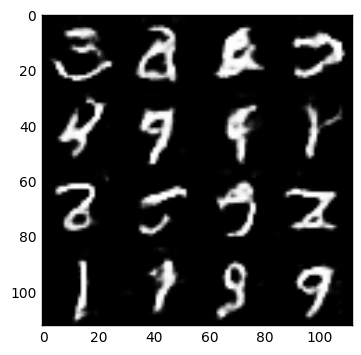

Epoch 1/2... Discriminator Loss: 1.1153... Generator Loss: 0.8172
Epoch 1/2... Discriminator Loss: 1.0504... Generator Loss: 0.8499
Epoch 1/2... Discriminator Loss: 0.9383... Generator Loss: 1.4293
Epoch 1/2... Discriminator Loss: 1.3517... Generator Loss: 0.6343
Epoch 1/2... Discriminator Loss: 1.0145... Generator Loss: 1.5391
Epoch 1/2... Discriminator Loss: 1.7823... Generator Loss: 0.3586
Epoch 1/2... Discriminator Loss: 1.1473... Generator Loss: 1.8739
Epoch 1/2... Discriminator Loss: 1.4660... Generator Loss: 0.4731
Epoch 1/2... Discriminator Loss: 1.0588... Generator Loss: 1.9164
Epoch 1/2... Discriminator Loss: 1.3713... Generator Loss: 0.5831
Epoch 1/2... Discriminator Loss: 0.9506... Generator Loss: 1.2027
Epoch 1/2... Discriminator Loss: 0.9910... Generator Loss: 0.9837
Epoch 1/2... Discriminator Loss: 1.0695... Generator Loss: 0.8127
Epoch 1/2... Discriminator Loss: 1.5097... Generator Loss: 0.4786
Epoch 1/2... Discriminator Loss: 1.5985... Generator Loss: 2.3922
Epoch 1/2.

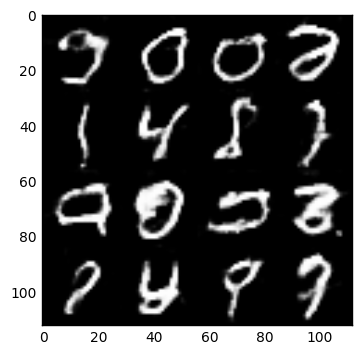

Epoch 1/2... Discriminator Loss: 1.1765... Generator Loss: 0.9273
Epoch 1/2... Discriminator Loss: 0.8894... Generator Loss: 1.2233
Epoch 1/2... Discriminator Loss: 1.4306... Generator Loss: 0.4912
Epoch 1/2... Discriminator Loss: 1.0487... Generator Loss: 1.5852
Epoch 1/2... Discriminator Loss: 1.1649... Generator Loss: 0.7475
Epoch 1/2... Discriminator Loss: 1.0877... Generator Loss: 0.7835
Epoch 1/2... Discriminator Loss: 0.9336... Generator Loss: 1.1900
Epoch 1/2... Discriminator Loss: 1.3977... Generator Loss: 0.5409
Epoch 1/2... Discriminator Loss: 1.1572... Generator Loss: 0.7920
Epoch 1/2... Discriminator Loss: 0.9163... Generator Loss: 1.3636
Epoch 1/2... Discriminator Loss: 1.0513... Generator Loss: 0.8235
Epoch 1/2... Discriminator Loss: 1.1829... Generator Loss: 0.8388
Epoch 1/2... Discriminator Loss: 1.0837... Generator Loss: 0.9551
Epoch 1/2... Discriminator Loss: 1.0057... Generator Loss: 1.0884
Epoch 1/2... Discriminator Loss: 1.2278... Generator Loss: 0.6976
Epoch 1/2.

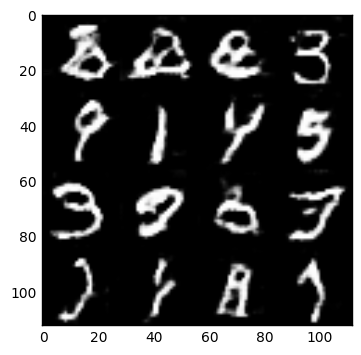

Epoch 1/2... Discriminator Loss: 1.2760... Generator Loss: 0.6649
Epoch 1/2... Discriminator Loss: 1.2810... Generator Loss: 2.1116
Epoch 1/2... Discriminator Loss: 1.9612... Generator Loss: 0.3462
Epoch 1/2... Discriminator Loss: 1.1863... Generator Loss: 1.3446
Epoch 1/2... Discriminator Loss: 0.9165... Generator Loss: 1.2672
Epoch 1/2... Discriminator Loss: 1.4256... Generator Loss: 0.5468
Epoch 1/2... Discriminator Loss: 0.9247... Generator Loss: 1.2921
Epoch 1/2... Discriminator Loss: 0.9750... Generator Loss: 1.0595
Epoch 1/2... Discriminator Loss: 1.7078... Generator Loss: 0.4227
Epoch 1/2... Discriminator Loss: 1.6136... Generator Loss: 2.5738
Epoch 1/2... Discriminator Loss: 1.3481... Generator Loss: 0.5357
Epoch 1/2... Discriminator Loss: 0.9061... Generator Loss: 1.2259
Epoch 1/2... Discriminator Loss: 0.9053... Generator Loss: 1.2917
Epoch 1/2... Discriminator Loss: 1.4930... Generator Loss: 0.4910
Epoch 1/2... Discriminator Loss: 1.1394... Generator Loss: 1.7523
Epoch 1/2.

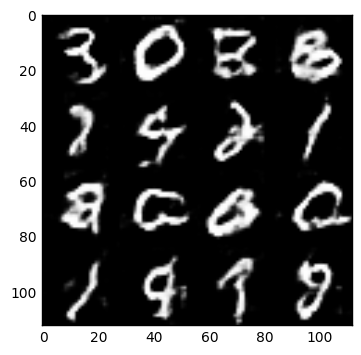

Epoch 1/2... Discriminator Loss: 1.8203... Generator Loss: 0.3548
Epoch 1/2... Discriminator Loss: 1.5789... Generator Loss: 1.9412
Epoch 1/2... Discriminator Loss: 1.7158... Generator Loss: 0.4205
Epoch 1/2... Discriminator Loss: 1.1478... Generator Loss: 1.3773
Epoch 1/2... Discriminator Loss: 1.2990... Generator Loss: 0.6941
Epoch 1/2... Discriminator Loss: 1.0157... Generator Loss: 1.2077
Epoch 1/2... Discriminator Loss: 1.1761... Generator Loss: 0.7434
Epoch 1/2... Discriminator Loss: 0.9613... Generator Loss: 0.9982
Epoch 1/2... Discriminator Loss: 0.9859... Generator Loss: 1.2285
Epoch 1/2... Discriminator Loss: 1.6111... Generator Loss: 0.4177
Epoch 1/2... Discriminator Loss: 1.0149... Generator Loss: 1.5496
Epoch 1/2... Discriminator Loss: 1.0987... Generator Loss: 0.7926
Epoch 1/2... Discriminator Loss: 1.0010... Generator Loss: 0.9407
Epoch 1/2... Discriminator Loss: 1.0006... Generator Loss: 0.9617
Epoch 1/2... Discriminator Loss: 1.1515... Generator Loss: 0.7733
Epoch 1/2.

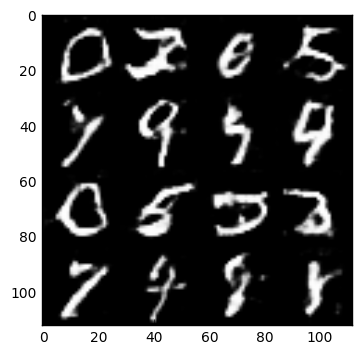

Epoch 1/2... Discriminator Loss: 1.5526... Generator Loss: 0.4835
Epoch 1/2... Discriminator Loss: 0.9383... Generator Loss: 1.4405
Epoch 1/2... Discriminator Loss: 0.9814... Generator Loss: 1.3106
Epoch 1/2... Discriminator Loss: 1.4527... Generator Loss: 0.4840
Epoch 1/2... Discriminator Loss: 0.9503... Generator Loss: 1.2467
Epoch 1/2... Discriminator Loss: 0.9977... Generator Loss: 1.2848
Epoch 1/2... Discriminator Loss: 1.3692... Generator Loss: 0.5126
Epoch 1/2... Discriminator Loss: 1.0393... Generator Loss: 1.2898
Epoch 1/2... Discriminator Loss: 0.8934... Generator Loss: 1.0447
Epoch 1/2... Discriminator Loss: 1.0595... Generator Loss: 0.9289
Epoch 1/2... Discriminator Loss: 0.9974... Generator Loss: 0.9839
Epoch 1/2... Discriminator Loss: 0.9108... Generator Loss: 1.2246
Epoch 1/2... Discriminator Loss: 0.9399... Generator Loss: 0.9568
Epoch 1/2... Discriminator Loss: 1.1831... Generator Loss: 0.7547
Epoch 1/2... Discriminator Loss: 0.8095... Generator Loss: 1.7821
Epoch 1/2.

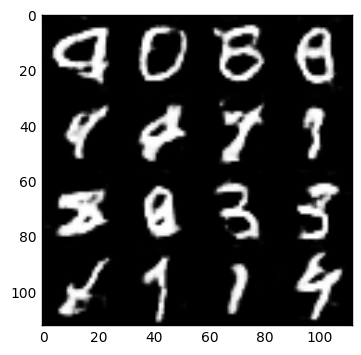

Epoch 1/2... Discriminator Loss: 0.8632... Generator Loss: 1.2307
Epoch 1/2... Discriminator Loss: 0.9853... Generator Loss: 0.8592
Epoch 1/2... Discriminator Loss: 0.8021... Generator Loss: 1.3321
Epoch 1/2... Discriminator Loss: 0.7787... Generator Loss: 1.3889
Epoch 1/2... Discriminator Loss: 1.6372... Generator Loss: 0.3874
Epoch 1/2... Discriminator Loss: 1.0901... Generator Loss: 1.5731
Epoch 1/2... Discriminator Loss: 1.1358... Generator Loss: 0.7773
Epoch 1/2... Discriminator Loss: 0.9301... Generator Loss: 1.1236
Epoch 1/2... Discriminator Loss: 0.7451... Generator Loss: 1.7147
Epoch 1/2... Discriminator Loss: 1.6984... Generator Loss: 0.3993
Epoch 1/2... Discriminator Loss: 0.9869... Generator Loss: 1.6165
Epoch 1/2... Discriminator Loss: 1.2242... Generator Loss: 0.7788
Epoch 1/2... Discriminator Loss: 1.2931... Generator Loss: 0.7097
Epoch 1/2... Discriminator Loss: 1.0418... Generator Loss: 0.9265
Epoch 1/2... Discriminator Loss: 0.9937... Generator Loss: 1.1241
Epoch 1/2.

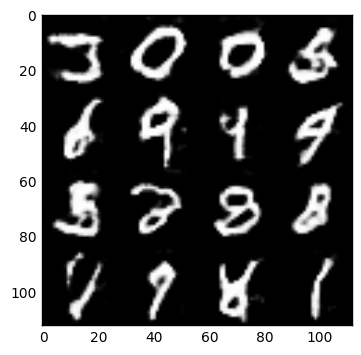

Epoch 1/2... Discriminator Loss: 1.0790... Generator Loss: 0.7483
Epoch 1/2... Discriminator Loss: 0.8663... Generator Loss: 1.1141
Epoch 1/2... Discriminator Loss: 0.9708... Generator Loss: 0.9756
Epoch 1/2... Discriminator Loss: 0.9046... Generator Loss: 1.1233
Epoch 1/2... Discriminator Loss: 0.9858... Generator Loss: 1.0291
Epoch 1/2... Discriminator Loss: 1.0664... Generator Loss: 0.8564
Epoch 1/2... Discriminator Loss: 1.3847... Generator Loss: 0.5210
Epoch 1/2... Discriminator Loss: 1.0563... Generator Loss: 0.9492
Epoch 1/2... Discriminator Loss: 0.9339... Generator Loss: 1.2205
Epoch 1/2... Discriminator Loss: 0.9043... Generator Loss: 1.0118
Epoch 1/2... Discriminator Loss: 1.0894... Generator Loss: 0.8137
Epoch 1/2... Discriminator Loss: 1.0380... Generator Loss: 0.8758
Epoch 1/2... Discriminator Loss: 0.8878... Generator Loss: 1.4386
Epoch 1/2... Discriminator Loss: 0.8659... Generator Loss: 1.1485
Epoch 1/2... Discriminator Loss: 1.3789... Generator Loss: 0.4997
Epoch 1/2.

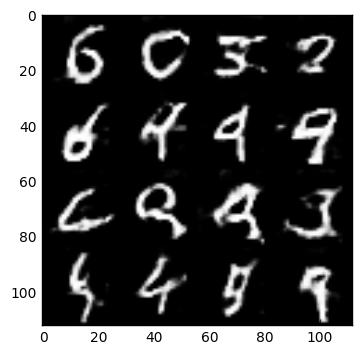

Epoch 1/2... Discriminator Loss: 1.4574... Generator Loss: 0.5153
Epoch 1/2... Discriminator Loss: 0.9797... Generator Loss: 1.5073
Epoch 1/2... Discriminator Loss: 1.1571... Generator Loss: 0.7259
Epoch 1/2... Discriminator Loss: 1.1471... Generator Loss: 0.9859
Epoch 1/2... Discriminator Loss: 0.7891... Generator Loss: 1.4026
Epoch 1/2... Discriminator Loss: 0.9172... Generator Loss: 1.0693
Epoch 1/2... Discriminator Loss: 1.3997... Generator Loss: 0.5456
Epoch 1/2... Discriminator Loss: 1.1157... Generator Loss: 1.7060
Epoch 1/2... Discriminator Loss: 1.3051... Generator Loss: 0.5997
Epoch 1/2... Discriminator Loss: 0.9169... Generator Loss: 1.1194
Epoch 1/2... Discriminator Loss: 0.8943... Generator Loss: 1.0662
Epoch 1/2... Discriminator Loss: 0.8106... Generator Loss: 1.3996
Epoch 1/2... Discriminator Loss: 0.9300... Generator Loss: 1.1589
Epoch 1/2... Discriminator Loss: 1.3185... Generator Loss: 0.6342
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 0.9838
Epoch 1/2.

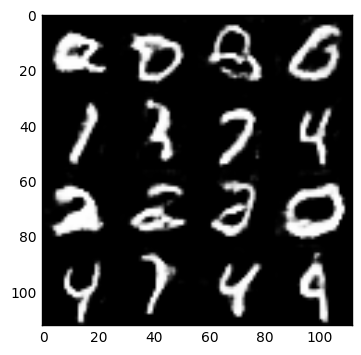

Epoch 1/2... Discriminator Loss: 1.0875... Generator Loss: 0.8336
Epoch 1/2... Discriminator Loss: 0.8082... Generator Loss: 1.7748
Epoch 1/2... Discriminator Loss: 0.7725... Generator Loss: 1.2274
Epoch 1/2... Discriminator Loss: 1.1916... Generator Loss: 0.6770
Epoch 1/2... Discriminator Loss: 0.8640... Generator Loss: 1.5966
Epoch 1/2... Discriminator Loss: 0.8667... Generator Loss: 1.2170
Epoch 1/2... Discriminator Loss: 1.8281... Generator Loss: 0.3456
Epoch 1/2... Discriminator Loss: 1.1062... Generator Loss: 2.0860
Epoch 1/2... Discriminator Loss: 1.3458... Generator Loss: 0.6153
Epoch 1/2... Discriminator Loss: 1.1432... Generator Loss: 1.3208
Epoch 1/2... Discriminator Loss: 0.8691... Generator Loss: 1.5670
Epoch 1/2... Discriminator Loss: 1.0448... Generator Loss: 0.9104
Epoch 1/2... Discriminator Loss: 1.7463... Generator Loss: 0.3844
Epoch 1/2... Discriminator Loss: 2.6178... Generator Loss: 3.5783
Epoch 1/2... Discriminator Loss: 2.8082... Generator Loss: 0.2295
Epoch 1/2.

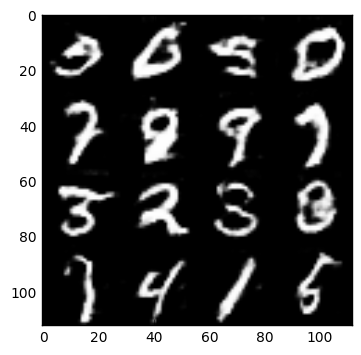

Epoch 1/2... Discriminator Loss: 0.9055... Generator Loss: 2.0213
Epoch 1/2... Discriminator Loss: 0.9968... Generator Loss: 0.8774
Epoch 1/2... Discriminator Loss: 1.0214... Generator Loss: 0.8878
Epoch 1/2... Discriminator Loss: 0.9252... Generator Loss: 1.2261
Epoch 1/2... Discriminator Loss: 0.8899... Generator Loss: 1.4675
Epoch 1/2... Discriminator Loss: 0.9611... Generator Loss: 0.9064
Epoch 1/2... Discriminator Loss: 0.9358... Generator Loss: 1.0729
Epoch 1/2... Discriminator Loss: 1.0827... Generator Loss: 0.9539
Epoch 1/2... Discriminator Loss: 0.8945... Generator Loss: 1.2375
Epoch 1/2... Discriminator Loss: 1.3486... Generator Loss: 0.5731
Epoch 1/2... Discriminator Loss: 1.1069... Generator Loss: 1.9475
Epoch 1/2... Discriminator Loss: 1.6786... Generator Loss: 0.4114
Epoch 1/2... Discriminator Loss: 1.3384... Generator Loss: 2.3050
Epoch 1/2... Discriminator Loss: 1.0924... Generator Loss: 0.9026
Epoch 1/2... Discriminator Loss: 1.4127... Generator Loss: 0.5390
Epoch 1/2.

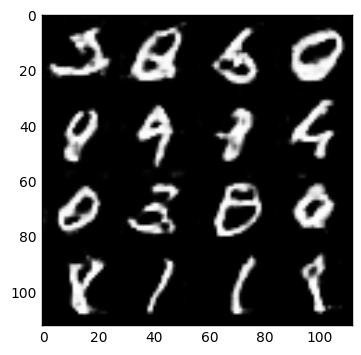

Epoch 1/2... Discriminator Loss: 0.8117... Generator Loss: 1.4362
Epoch 1/2... Discriminator Loss: 1.1059... Generator Loss: 0.7933
Epoch 1/2... Discriminator Loss: 1.2476... Generator Loss: 0.6172
Epoch 1/2... Discriminator Loss: 0.9899... Generator Loss: 2.1317
Epoch 1/2... Discriminator Loss: 1.1217... Generator Loss: 0.7448
Epoch 1/2... Discriminator Loss: 0.7361... Generator Loss: 1.5599
Epoch 1/2... Discriminator Loss: 0.8616... Generator Loss: 1.1485
Epoch 1/2... Discriminator Loss: 0.9687... Generator Loss: 0.9381
Epoch 1/2... Discriminator Loss: 0.8035... Generator Loss: 1.4166
Epoch 1/2... Discriminator Loss: 0.9086... Generator Loss: 1.0846
Epoch 1/2... Discriminator Loss: 1.0542... Generator Loss: 0.8759
Epoch 1/2... Discriminator Loss: 0.8872... Generator Loss: 1.2528
Epoch 1/2... Discriminator Loss: 1.0115... Generator Loss: 0.9574
Epoch 1/2... Discriminator Loss: 0.9485... Generator Loss: 0.9871
Epoch 1/2... Discriminator Loss: 0.7765... Generator Loss: 1.4195
Epoch 1/2.

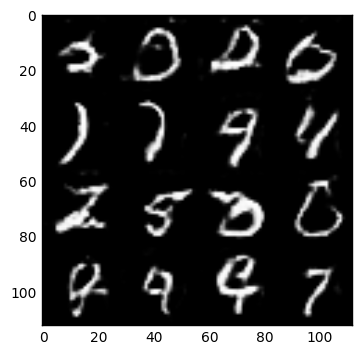

Epoch 1/2... Discriminator Loss: 1.2059... Generator Loss: 2.3255
Epoch 1/2... Discriminator Loss: 1.0893... Generator Loss: 0.8024
Epoch 1/2... Discriminator Loss: 1.6916... Generator Loss: 0.3673
Epoch 1/2... Discriminator Loss: 0.9657... Generator Loss: 1.7910
Epoch 1/2... Discriminator Loss: 1.2428... Generator Loss: 0.7052
Epoch 1/2... Discriminator Loss: 0.9543... Generator Loss: 1.3321
Epoch 1/2... Discriminator Loss: 0.8776... Generator Loss: 1.2528
Epoch 1/2... Discriminator Loss: 1.1633... Generator Loss: 0.6868
Epoch 1/2... Discriminator Loss: 0.9414... Generator Loss: 1.4586
Epoch 1/2... Discriminator Loss: 1.5752... Generator Loss: 0.3940
Epoch 1/2... Discriminator Loss: 0.8802... Generator Loss: 1.9647
Epoch 1/2... Discriminator Loss: 1.0890... Generator Loss: 0.8085
Epoch 1/2... Discriminator Loss: 1.1486... Generator Loss: 0.8152
Epoch 1/2... Discriminator Loss: 0.9255... Generator Loss: 1.4109
Epoch 1/2... Discriminator Loss: 0.8483... Generator Loss: 1.1016
Epoch 1/2.

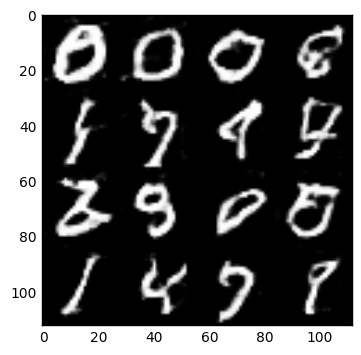

Epoch 1/2... Discriminator Loss: 0.9128... Generator Loss: 1.1229
Epoch 1/2... Discriminator Loss: 0.9571... Generator Loss: 1.0248
Epoch 1/2... Discriminator Loss: 0.8371... Generator Loss: 1.2946
Epoch 1/2... Discriminator Loss: 0.8752... Generator Loss: 1.0920
Epoch 1/2... Discriminator Loss: 0.9209... Generator Loss: 0.9689
Epoch 1/2... Discriminator Loss: 0.9929... Generator Loss: 0.9638
Epoch 1/2... Discriminator Loss: 0.8688... Generator Loss: 1.1126
Epoch 1/2... Discriminator Loss: 0.9324... Generator Loss: 0.9962
Epoch 1/2... Discriminator Loss: 0.9444... Generator Loss: 1.0056
Epoch 1/2... Discriminator Loss: 0.8044... Generator Loss: 1.2341
Epoch 1/2... Discriminator Loss: 1.1789... Generator Loss: 0.7108
Epoch 1/2... Discriminator Loss: 0.8907... Generator Loss: 1.9182
Epoch 1/2... Discriminator Loss: 1.4448... Generator Loss: 0.5282
Epoch 1/2... Discriminator Loss: 0.9893... Generator Loss: 1.5000
Epoch 1/2... Discriminator Loss: 1.0006... Generator Loss: 1.0904
Epoch 1/2.

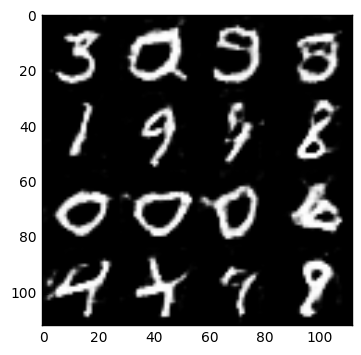

Epoch 1/2... Discriminator Loss: 1.1939... Generator Loss: 0.7057
Epoch 1/2... Discriminator Loss: 0.9042... Generator Loss: 1.7879
Epoch 1/2... Discriminator Loss: 0.9591... Generator Loss: 0.8890
Epoch 1/2... Discriminator Loss: 0.9786... Generator Loss: 0.9627
Epoch 1/2... Discriminator Loss: 0.8737... Generator Loss: 1.8795
Epoch 1/2... Discriminator Loss: 1.7986... Generator Loss: 0.3474
Epoch 1/2... Discriminator Loss: 1.2637... Generator Loss: 1.2363
Epoch 1/2... Discriminator Loss: 1.0144... Generator Loss: 1.0211
Epoch 1/2... Discriminator Loss: 0.9581... Generator Loss: 1.2153
Epoch 1/2... Discriminator Loss: 0.9343... Generator Loss: 0.9995
Epoch 1/2... Discriminator Loss: 1.0068... Generator Loss: 0.8672
Epoch 1/2... Discriminator Loss: 0.8128... Generator Loss: 1.7128
Epoch 1/2... Discriminator Loss: 0.8634... Generator Loss: 1.0817
Epoch 1/2... Discriminator Loss: 1.1508... Generator Loss: 0.7029
Epoch 1/2... Discriminator Loss: 0.6945... Generator Loss: 1.7085
Epoch 1/2.

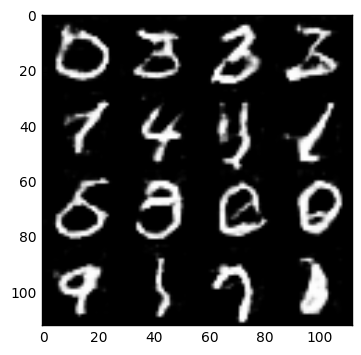

Epoch 1/2... Discriminator Loss: 1.0157... Generator Loss: 0.8952
Epoch 1/2... Discriminator Loss: 0.9607... Generator Loss: 1.1248
Epoch 1/2... Discriminator Loss: 0.8119... Generator Loss: 1.3870
Epoch 1/2... Discriminator Loss: 1.0953... Generator Loss: 0.8259
Epoch 1/2... Discriminator Loss: 1.0669... Generator Loss: 0.8821
Epoch 1/2... Discriminator Loss: 0.9298... Generator Loss: 1.3068
Epoch 1/2... Discriminator Loss: 0.8518... Generator Loss: 1.1697
Epoch 1/2... Discriminator Loss: 1.4256... Generator Loss: 0.4839
Epoch 1/2... Discriminator Loss: 0.7390... Generator Loss: 1.5739
Epoch 1/2... Discriminator Loss: 0.8237... Generator Loss: 1.5324
Epoch 1/2... Discriminator Loss: 1.0124... Generator Loss: 0.9289
Epoch 1/2... Discriminator Loss: 0.8305... Generator Loss: 1.1719
Epoch 1/2... Discriminator Loss: 1.0153... Generator Loss: 0.8742
Epoch 1/2... Discriminator Loss: 0.8901... Generator Loss: 1.3381
Epoch 1/2... Discriminator Loss: 0.9511... Generator Loss: 1.0208
Epoch 1/2.

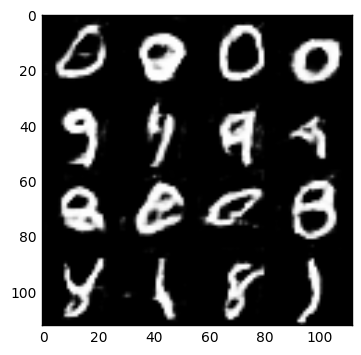

Epoch 1/2... Discriminator Loss: 0.8725... Generator Loss: 1.6421
Epoch 1/2... Discriminator Loss: 0.9579... Generator Loss: 0.9770
Epoch 1/2... Discriminator Loss: 0.9515... Generator Loss: 1.2222
Epoch 1/2... Discriminator Loss: 1.0362... Generator Loss: 0.9454
Epoch 1/2... Discriminator Loss: 0.9624... Generator Loss: 1.0231
Epoch 1/2... Discriminator Loss: 1.0432... Generator Loss: 0.8888
Epoch 1/2... Discriminator Loss: 0.9600... Generator Loss: 0.9397
Epoch 1/2... Discriminator Loss: 0.9100... Generator Loss: 1.0356
Epoch 1/2... Discriminator Loss: 1.1631... Generator Loss: 0.7839
Epoch 1/2... Discriminator Loss: 1.0308... Generator Loss: 0.9399
Epoch 1/2... Discriminator Loss: 0.8734... Generator Loss: 1.3569
Epoch 1/2... Discriminator Loss: 1.4425... Generator Loss: 0.4902
Epoch 1/2... Discriminator Loss: 1.0966... Generator Loss: 1.3820
Epoch 1/2... Discriminator Loss: 1.3100... Generator Loss: 0.5972
Epoch 1/2... Discriminator Loss: 1.3444... Generator Loss: 2.3909
Epoch 1/2.

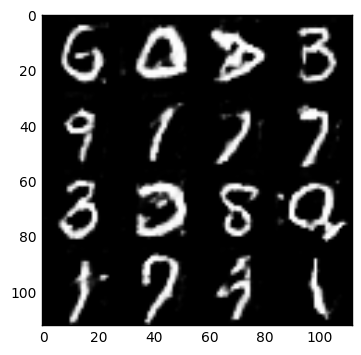

Epoch 2/2... Discriminator Loss: 1.1077... Generator Loss: 0.8622
Epoch 2/2... Discriminator Loss: 0.8770... Generator Loss: 1.3346
Epoch 2/2... Discriminator Loss: 1.1767... Generator Loss: 0.6704
Epoch 2/2... Discriminator Loss: 0.8469... Generator Loss: 1.2771
Epoch 2/2... Discriminator Loss: 0.8486... Generator Loss: 1.4708
Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 1.2798
Epoch 2/2... Discriminator Loss: 1.3051... Generator Loss: 0.5609
Epoch 2/2... Discriminator Loss: 0.8702... Generator Loss: 1.3758
Epoch 2/2... Discriminator Loss: 0.9005... Generator Loss: 1.0798
Epoch 2/2... Discriminator Loss: 0.9724... Generator Loss: 1.0339
Epoch 2/2... Discriminator Loss: 0.9456... Generator Loss: 1.0621
Epoch 2/2... Discriminator Loss: 0.8292... Generator Loss: 1.3605
Epoch 2/2... Discriminator Loss: 0.6841... Generator Loss: 1.5933
Epoch 2/2... Discriminator Loss: 0.9321... Generator Loss: 1.0220
Epoch 2/2... Discriminator Loss: 1.1814... Generator Loss: 0.6503
Epoch 2/2.

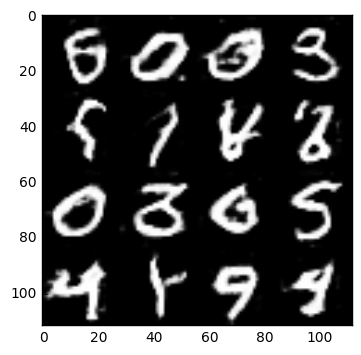

Epoch 2/2... Discriminator Loss: 0.9057... Generator Loss: 1.0879
Epoch 2/2... Discriminator Loss: 0.8134... Generator Loss: 1.2232
Epoch 2/2... Discriminator Loss: 0.8422... Generator Loss: 1.1849
Epoch 2/2... Discriminator Loss: 1.0734... Generator Loss: 0.7945
Epoch 2/2... Discriminator Loss: 1.0093... Generator Loss: 0.9962
Epoch 2/2... Discriminator Loss: 0.8217... Generator Loss: 1.2190
Epoch 2/2... Discriminator Loss: 0.9505... Generator Loss: 1.1225
Epoch 2/2... Discriminator Loss: 0.9418... Generator Loss: 0.9536
Epoch 2/2... Discriminator Loss: 1.3013... Generator Loss: 0.5993
Epoch 2/2... Discriminator Loss: 0.9763... Generator Loss: 1.9397
Epoch 2/2... Discriminator Loss: 1.5250... Generator Loss: 0.4633
Epoch 2/2... Discriminator Loss: 0.7291... Generator Loss: 1.7088
Epoch 2/2... Discriminator Loss: 0.8818... Generator Loss: 1.1200
Epoch 2/2... Discriminator Loss: 1.6298... Generator Loss: 0.4566
Epoch 2/2... Discriminator Loss: 1.0064... Generator Loss: 1.5105
Epoch 2/2.

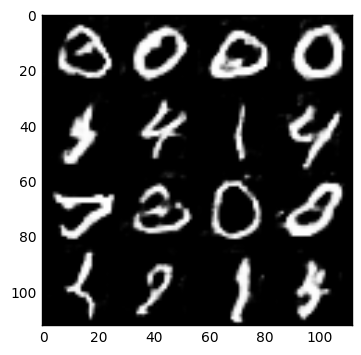

Epoch 2/2... Discriminator Loss: 0.7800... Generator Loss: 1.6851
Epoch 2/2... Discriminator Loss: 0.9806... Generator Loss: 0.8980
Epoch 2/2... Discriminator Loss: 0.8583... Generator Loss: 1.1037
Epoch 2/2... Discriminator Loss: 0.8665... Generator Loss: 1.2890
Epoch 2/2... Discriminator Loss: 1.0806... Generator Loss: 0.7865
Epoch 2/2... Discriminator Loss: 0.7819... Generator Loss: 1.5955
Epoch 2/2... Discriminator Loss: 0.9626... Generator Loss: 0.9698
Epoch 2/2... Discriminator Loss: 0.9181... Generator Loss: 1.4572
Epoch 2/2... Discriminator Loss: 1.3936... Generator Loss: 0.5189
Epoch 2/2... Discriminator Loss: 0.8115... Generator Loss: 1.9446
Epoch 2/2... Discriminator Loss: 0.9619... Generator Loss: 1.0030
Epoch 2/2... Discriminator Loss: 1.6641... Generator Loss: 0.3855
Epoch 2/2... Discriminator Loss: 1.1350... Generator Loss: 1.8562
Epoch 2/2... Discriminator Loss: 1.2682... Generator Loss: 0.6391
Epoch 2/2... Discriminator Loss: 1.2123... Generator Loss: 0.6273
Epoch 2/2.

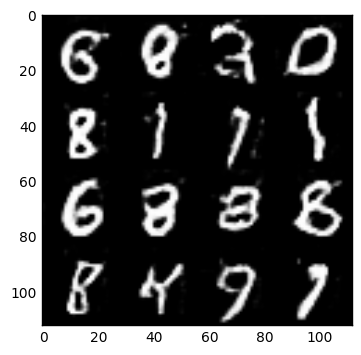

Epoch 2/2... Discriminator Loss: 0.8395... Generator Loss: 2.2662
Epoch 2/2... Discriminator Loss: 1.5462... Generator Loss: 0.4520
Epoch 2/2... Discriminator Loss: 2.0983... Generator Loss: 3.0698
Epoch 2/2... Discriminator Loss: 2.7555... Generator Loss: 0.1471
Epoch 2/2... Discriminator Loss: 1.5288... Generator Loss: 2.5678
Epoch 2/2... Discriminator Loss: 0.7507... Generator Loss: 1.7487
Epoch 2/2... Discriminator Loss: 0.9757... Generator Loss: 1.1825
Epoch 2/2... Discriminator Loss: 1.0726... Generator Loss: 0.8888
Epoch 2/2... Discriminator Loss: 0.8655... Generator Loss: 1.4377
Epoch 2/2... Discriminator Loss: 0.9279... Generator Loss: 1.0190
Epoch 2/2... Discriminator Loss: 1.0527... Generator Loss: 0.9378
Epoch 2/2... Discriminator Loss: 1.0156... Generator Loss: 0.8888
Epoch 2/2... Discriminator Loss: 0.7451... Generator Loss: 1.5900
Epoch 2/2... Discriminator Loss: 0.7342... Generator Loss: 1.3757
Epoch 2/2... Discriminator Loss: 1.0216... Generator Loss: 0.9249
Epoch 2/2.

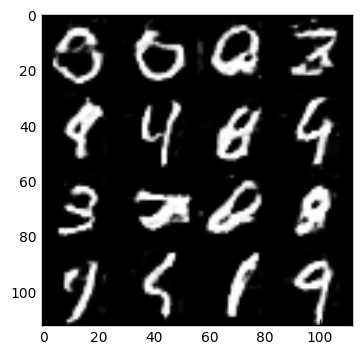

Epoch 2/2... Discriminator Loss: 0.7859... Generator Loss: 1.4081
Epoch 2/2... Discriminator Loss: 0.9964... Generator Loss: 1.0097
Epoch 2/2... Discriminator Loss: 1.1339... Generator Loss: 0.6839
Epoch 2/2... Discriminator Loss: 0.9612... Generator Loss: 1.2229
Epoch 2/2... Discriminator Loss: 0.8100... Generator Loss: 1.4153
Epoch 2/2... Discriminator Loss: 1.5985... Generator Loss: 0.4160
Epoch 2/2... Discriminator Loss: 1.3154... Generator Loss: 2.2909
Epoch 2/2... Discriminator Loss: 1.7566... Generator Loss: 0.3743
Epoch 2/2... Discriminator Loss: 0.8090... Generator Loss: 1.5433
Epoch 2/2... Discriminator Loss: 0.8196... Generator Loss: 1.4453
Epoch 2/2... Discriminator Loss: 1.3200... Generator Loss: 0.6206
Epoch 2/2... Discriminator Loss: 0.7955... Generator Loss: 1.7431
Epoch 2/2... Discriminator Loss: 0.8125... Generator Loss: 1.3088
Epoch 2/2... Discriminator Loss: 1.3755... Generator Loss: 0.5325
Epoch 2/2... Discriminator Loss: 0.9258... Generator Loss: 1.5381
Epoch 2/2.

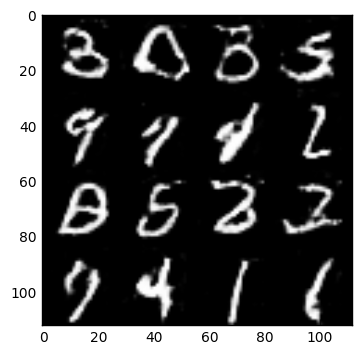

Epoch 2/2... Discriminator Loss: 0.8650... Generator Loss: 1.2000
Epoch 2/2... Discriminator Loss: 0.8024... Generator Loss: 1.2736
Epoch 2/2... Discriminator Loss: 0.7047... Generator Loss: 1.6557
Epoch 2/2... Discriminator Loss: 1.5388... Generator Loss: 0.4572
Epoch 2/2... Discriminator Loss: 1.0484... Generator Loss: 1.3048
Epoch 2/2... Discriminator Loss: 0.8759... Generator Loss: 2.6350
Epoch 2/2... Discriminator Loss: 1.6607... Generator Loss: 0.4553
Epoch 2/2... Discriminator Loss: 1.7287... Generator Loss: 2.8204
Epoch 2/2... Discriminator Loss: 3.6378... Generator Loss: 0.0834
Epoch 2/2... Discriminator Loss: 2.1287... Generator Loss: 3.3933
Epoch 2/2... Discriminator Loss: 1.5348... Generator Loss: 0.5223
Epoch 2/2... Discriminator Loss: 1.2669... Generator Loss: 1.3205
Epoch 2/2... Discriminator Loss: 0.7942... Generator Loss: 1.9685
Epoch 2/2... Discriminator Loss: 1.3813... Generator Loss: 0.5827
Epoch 2/2... Discriminator Loss: 0.9392... Generator Loss: 1.2603
Epoch 2/2.

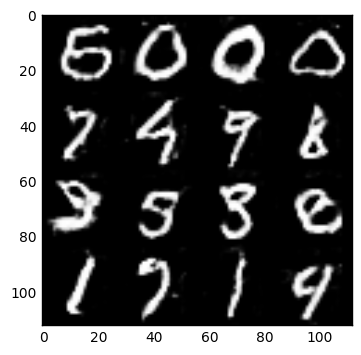

Epoch 2/2... Discriminator Loss: 0.8972... Generator Loss: 1.1400
Epoch 2/2... Discriminator Loss: 0.8129... Generator Loss: 1.2524
Epoch 2/2... Discriminator Loss: 1.1036... Generator Loss: 0.7951
Epoch 2/2... Discriminator Loss: 0.8623... Generator Loss: 1.3340
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 1.5156
Epoch 2/2... Discriminator Loss: 1.1650... Generator Loss: 0.7286
Epoch 2/2... Discriminator Loss: 0.9840... Generator Loss: 1.2330
Epoch 2/2... Discriminator Loss: 1.0802... Generator Loss: 0.8071
Epoch 2/2... Discriminator Loss: 0.8806... Generator Loss: 1.1607
Epoch 2/2... Discriminator Loss: 0.9513... Generator Loss: 0.9164
Epoch 2/2... Discriminator Loss: 0.9041... Generator Loss: 1.1515
Epoch 2/2... Discriminator Loss: 0.7560... Generator Loss: 1.6112
Epoch 2/2... Discriminator Loss: 0.9320... Generator Loss: 1.0229
Epoch 2/2... Discriminator Loss: 0.7334... Generator Loss: 1.4792
Epoch 2/2... Discriminator Loss: 0.9245... Generator Loss: 0.9063
Epoch 2/2.

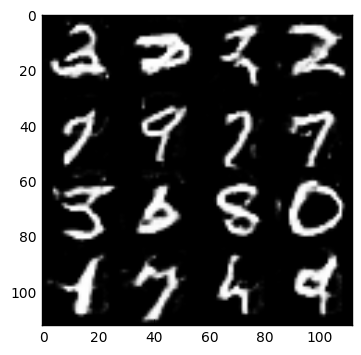

Epoch 2/2... Discriminator Loss: 0.7543... Generator Loss: 1.7590
Epoch 2/2... Discriminator Loss: 1.2419... Generator Loss: 0.6670
Epoch 2/2... Discriminator Loss: 0.8268... Generator Loss: 1.4534
Epoch 2/2... Discriminator Loss: 1.1177... Generator Loss: 0.7778
Epoch 2/2... Discriminator Loss: 0.7805... Generator Loss: 1.4945
Epoch 2/2... Discriminator Loss: 1.0544... Generator Loss: 0.8159
Epoch 2/2... Discriminator Loss: 0.9754... Generator Loss: 0.9961
Epoch 2/2... Discriminator Loss: 0.8010... Generator Loss: 1.7747
Epoch 2/2... Discriminator Loss: 1.0081... Generator Loss: 0.8487
Epoch 2/2... Discriminator Loss: 0.9709... Generator Loss: 1.1930
Epoch 2/2... Discriminator Loss: 0.8215... Generator Loss: 1.2848
Epoch 2/2... Discriminator Loss: 1.0218... Generator Loss: 0.8290
Epoch 2/2... Discriminator Loss: 0.7172... Generator Loss: 1.6600
Epoch 2/2... Discriminator Loss: 0.9137... Generator Loss: 1.0449
Epoch 2/2... Discriminator Loss: 0.8287... Generator Loss: 1.2128
Epoch 2/2.

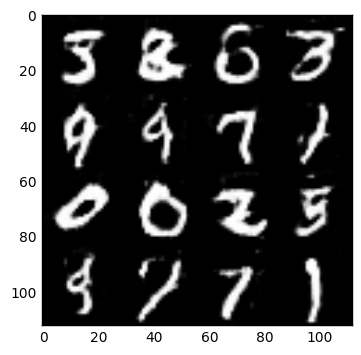

Epoch 2/2... Discriminator Loss: 1.2262... Generator Loss: 0.7404
Epoch 2/2... Discriminator Loss: 0.9145... Generator Loss: 1.2707
Epoch 2/2... Discriminator Loss: 0.9113... Generator Loss: 2.2509
Epoch 2/2... Discriminator Loss: 1.4768... Generator Loss: 0.5035
Epoch 2/2... Discriminator Loss: 0.9174... Generator Loss: 1.4553
Epoch 2/2... Discriminator Loss: 0.8880... Generator Loss: 1.5298
Epoch 2/2... Discriminator Loss: 1.1113... Generator Loss: 0.8567
Epoch 2/2... Discriminator Loss: 0.8645... Generator Loss: 1.1549
Epoch 2/2... Discriminator Loss: 0.8719... Generator Loss: 1.7308
Epoch 2/2... Discriminator Loss: 0.9094... Generator Loss: 0.9863
Epoch 2/2... Discriminator Loss: 0.7705... Generator Loss: 1.5348
Epoch 2/2... Discriminator Loss: 1.1052... Generator Loss: 0.8229
Epoch 2/2... Discriminator Loss: 0.8162... Generator Loss: 1.5451
Epoch 2/2... Discriminator Loss: 1.1791... Generator Loss: 0.6903
Epoch 2/2... Discriminator Loss: 0.9318... Generator Loss: 1.1132
Epoch 2/2.

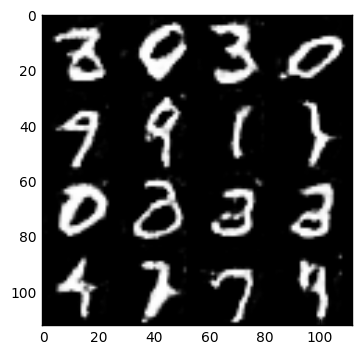

Epoch 2/2... Discriminator Loss: 1.0811... Generator Loss: 0.8070
Epoch 2/2... Discriminator Loss: 0.8827... Generator Loss: 1.4828
Epoch 2/2... Discriminator Loss: 0.8022... Generator Loss: 1.4091
Epoch 2/2... Discriminator Loss: 0.7542... Generator Loss: 1.3143
Epoch 2/2... Discriminator Loss: 1.2140... Generator Loss: 0.6664
Epoch 2/2... Discriminator Loss: 0.8469... Generator Loss: 1.6918
Epoch 2/2... Discriminator Loss: 0.7493... Generator Loss: 1.3683
Epoch 2/2... Discriminator Loss: 1.0138... Generator Loss: 0.8726
Epoch 2/2... Discriminator Loss: 0.8692... Generator Loss: 1.1816
Epoch 2/2... Discriminator Loss: 0.8288... Generator Loss: 1.4852
Epoch 2/2... Discriminator Loss: 1.2091... Generator Loss: 0.6316
Epoch 2/2... Discriminator Loss: 1.0622... Generator Loss: 1.0897
Epoch 2/2... Discriminator Loss: 0.7019... Generator Loss: 2.0283
Epoch 2/2... Discriminator Loss: 0.9423... Generator Loss: 1.0241
Epoch 2/2... Discriminator Loss: 0.9486... Generator Loss: 0.9374
Epoch 2/2.

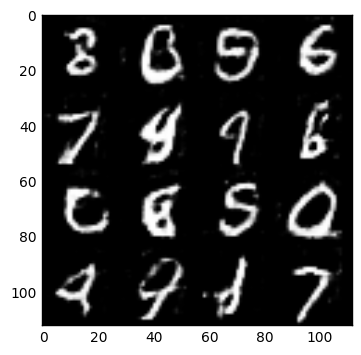

Epoch 2/2... Discriminator Loss: 0.8056... Generator Loss: 1.2517
Epoch 2/2... Discriminator Loss: 0.7862... Generator Loss: 1.2681
Epoch 2/2... Discriminator Loss: 0.7858... Generator Loss: 1.1544
Epoch 2/2... Discriminator Loss: 0.7944... Generator Loss: 1.2320
Epoch 2/2... Discriminator Loss: 0.7355... Generator Loss: 1.4522
Epoch 2/2... Discriminator Loss: 0.8527... Generator Loss: 1.2430
Epoch 2/2... Discriminator Loss: 0.6802... Generator Loss: 1.6712
Epoch 2/2... Discriminator Loss: 1.5820... Generator Loss: 0.4613
Epoch 2/2... Discriminator Loss: 1.3562... Generator Loss: 2.6771
Epoch 2/2... Discriminator Loss: 2.8489... Generator Loss: 0.1569
Epoch 2/2... Discriminator Loss: 1.0076... Generator Loss: 1.9735
Epoch 2/2... Discriminator Loss: 0.9652... Generator Loss: 2.3119
Epoch 2/2... Discriminator Loss: 0.8212... Generator Loss: 1.3460
Epoch 2/2... Discriminator Loss: 0.9694... Generator Loss: 1.0498
Epoch 2/2... Discriminator Loss: 0.9496... Generator Loss: 1.0714
Epoch 2/2.

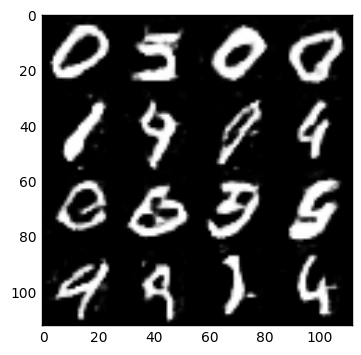

Epoch 2/2... Discriminator Loss: 0.8153... Generator Loss: 1.3117
Epoch 2/2... Discriminator Loss: 0.9592... Generator Loss: 0.9979
Epoch 2/2... Discriminator Loss: 0.8889... Generator Loss: 1.1411
Epoch 2/2... Discriminator Loss: 0.7950... Generator Loss: 1.2885
Epoch 2/2... Discriminator Loss: 0.8087... Generator Loss: 1.0842
Epoch 2/2... Discriminator Loss: 0.8376... Generator Loss: 1.3413
Epoch 2/2... Discriminator Loss: 0.8429... Generator Loss: 1.1959
Epoch 2/2... Discriminator Loss: 1.0444... Generator Loss: 0.8359
Epoch 2/2... Discriminator Loss: 0.8616... Generator Loss: 1.3570
Epoch 2/2... Discriminator Loss: 0.8286... Generator Loss: 1.3062
Epoch 2/2... Discriminator Loss: 1.4964... Generator Loss: 0.4471
Epoch 2/2... Discriminator Loss: 1.0899... Generator Loss: 1.3605
Epoch 2/2... Discriminator Loss: 0.9459... Generator Loss: 1.1577
Epoch 2/2... Discriminator Loss: 1.1835... Generator Loss: 0.6930
Epoch 2/2... Discriminator Loss: 0.8214... Generator Loss: 1.4098
Epoch 2/2.

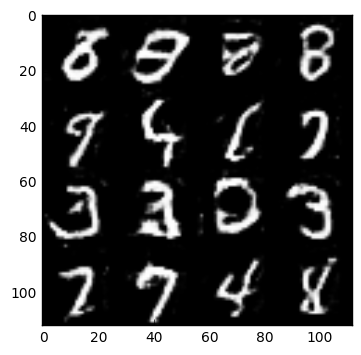

Epoch 2/2... Discriminator Loss: 0.9416... Generator Loss: 1.2004
Epoch 2/2... Discriminator Loss: 1.0709... Generator Loss: 0.8582
Epoch 2/2... Discriminator Loss: 0.9118... Generator Loss: 1.3517
Epoch 2/2... Discriminator Loss: 0.8353... Generator Loss: 1.5148
Epoch 2/2... Discriminator Loss: 1.1110... Generator Loss: 0.9153
Epoch 2/2... Discriminator Loss: 1.0457... Generator Loss: 0.8918
Epoch 2/2... Discriminator Loss: 0.8404... Generator Loss: 1.4573
Epoch 2/2... Discriminator Loss: 0.9791... Generator Loss: 0.8958
Epoch 2/2... Discriminator Loss: 0.9811... Generator Loss: 0.8935
Epoch 2/2... Discriminator Loss: 0.6836... Generator Loss: 1.7874
Epoch 2/2... Discriminator Loss: 1.2468... Generator Loss: 0.6187
Epoch 2/2... Discriminator Loss: 0.8457... Generator Loss: 1.3148
Epoch 2/2... Discriminator Loss: 0.7451... Generator Loss: 1.4341
Epoch 2/2... Discriminator Loss: 1.3649... Generator Loss: 0.5505
Epoch 2/2... Discriminator Loss: 1.1858... Generator Loss: 1.7015
Epoch 2/2.

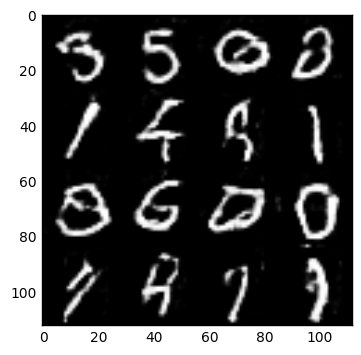

Epoch 2/2... Discriminator Loss: 0.8716... Generator Loss: 1.2714
Epoch 2/2... Discriminator Loss: 0.8554... Generator Loss: 1.1528
Epoch 2/2... Discriminator Loss: 1.1579... Generator Loss: 0.7637
Epoch 2/2... Discriminator Loss: 0.9638... Generator Loss: 1.1206
Epoch 2/2... Discriminator Loss: 0.8048... Generator Loss: 1.4305
Epoch 2/2... Discriminator Loss: 0.7830... Generator Loss: 1.3872
Epoch 2/2... Discriminator Loss: 0.6063... Generator Loss: 1.7186
Epoch 2/2... Discriminator Loss: 1.4039... Generator Loss: 0.5377
Epoch 2/2... Discriminator Loss: 1.0013... Generator Loss: 1.6429
Epoch 2/2... Discriminator Loss: 1.6396... Generator Loss: 0.4037
Epoch 2/2... Discriminator Loss: 1.8165... Generator Loss: 2.9463
Epoch 2/2... Discriminator Loss: 1.9744... Generator Loss: 0.4287
Epoch 2/2... Discriminator Loss: 0.9536... Generator Loss: 1.5278
Epoch 2/2... Discriminator Loss: 1.0975... Generator Loss: 2.1613
Epoch 2/2... Discriminator Loss: 1.0535... Generator Loss: 0.9572
Epoch 2/2.

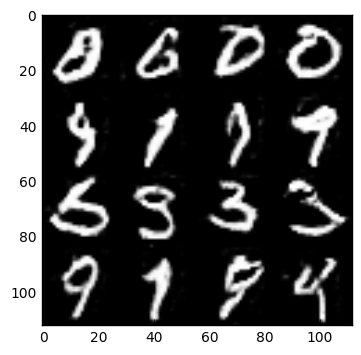

Epoch 2/2... Discriminator Loss: 1.6963... Generator Loss: 0.3945
Epoch 2/2... Discriminator Loss: 0.8980... Generator Loss: 2.0334
Epoch 2/2... Discriminator Loss: 0.9122... Generator Loss: 1.0432
Epoch 2/2... Discriminator Loss: 1.3266... Generator Loss: 0.5906
Epoch 2/2... Discriminator Loss: 1.0770... Generator Loss: 1.1276
Epoch 2/2... Discriminator Loss: 0.9226... Generator Loss: 1.3373
Epoch 2/2... Discriminator Loss: 0.8973... Generator Loss: 1.2126
Epoch 2/2... Discriminator Loss: 0.7480... Generator Loss: 1.2798
Epoch 2/2... Discriminator Loss: 1.5743... Generator Loss: 0.5045
Epoch 2/2... Discriminator Loss: 0.7802... Generator Loss: 1.6463
Epoch 2/2... Discriminator Loss: 1.0318... Generator Loss: 0.8859
Epoch 2/2... Discriminator Loss: 0.9483... Generator Loss: 1.1597
Epoch 2/2... Discriminator Loss: 0.8517... Generator Loss: 1.3985
Epoch 2/2... Discriminator Loss: 0.9623... Generator Loss: 1.0046
Epoch 2/2... Discriminator Loss: 0.9394... Generator Loss: 1.0113
Epoch 2/2.

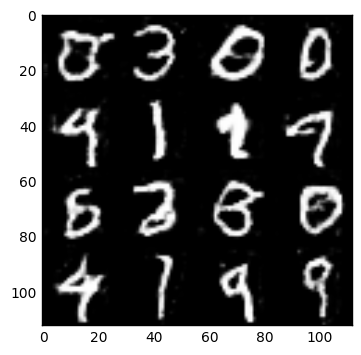

Epoch 2/2... Discriminator Loss: 1.2304... Generator Loss: 0.6431
Epoch 2/2... Discriminator Loss: 0.9538... Generator Loss: 1.2911
Epoch 2/2... Discriminator Loss: 0.6927... Generator Loss: 1.5307
Epoch 2/2... Discriminator Loss: 0.9741... Generator Loss: 0.8338
Epoch 2/2... Discriminator Loss: 0.9300... Generator Loss: 0.9874
Epoch 2/2... Discriminator Loss: 0.8555... Generator Loss: 1.2578
Epoch 2/2... Discriminator Loss: 0.7470... Generator Loss: 1.4592
Epoch 2/2... Discriminator Loss: 0.9116... Generator Loss: 1.1053
Epoch 2/2... Discriminator Loss: 0.7593... Generator Loss: 1.7452
Epoch 2/2... Discriminator Loss: 1.0461... Generator Loss: 0.8980
Epoch 2/2... Discriminator Loss: 0.7787... Generator Loss: 1.3868
Epoch 2/2... Discriminator Loss: 0.7723... Generator Loss: 1.2560
Epoch 2/2... Discriminator Loss: 0.8252... Generator Loss: 1.2129
Epoch 2/2... Discriminator Loss: 0.9467... Generator Loss: 1.0205
Epoch 2/2... Discriminator Loss: 0.7351... Generator Loss: 1.6126
Epoch 2/2.

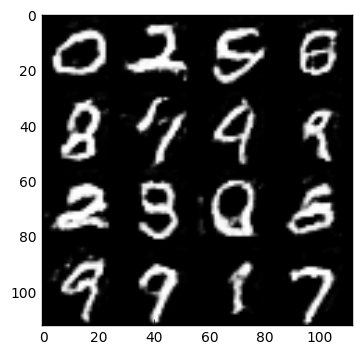

Epoch 2/2... Discriminator Loss: 1.0443... Generator Loss: 0.9047
Epoch 2/2... Discriminator Loss: 0.7872... Generator Loss: 1.7462
Epoch 2/2... Discriminator Loss: 1.2774... Generator Loss: 0.6723
Epoch 2/2... Discriminator Loss: 0.7368... Generator Loss: 1.7016
Epoch 2/2... Discriminator Loss: 0.9765... Generator Loss: 0.9441
Epoch 2/2... Discriminator Loss: 0.8272... Generator Loss: 1.2836
Epoch 2/2... Discriminator Loss: 0.9375... Generator Loss: 1.2345
Epoch 2/2... Discriminator Loss: 0.9528... Generator Loss: 1.0122
Epoch 2/2... Discriminator Loss: 0.8125... Generator Loss: 1.3545
Epoch 2/2... Discriminator Loss: 0.7622... Generator Loss: 1.4837
Epoch 2/2... Discriminator Loss: 1.2726... Generator Loss: 0.6717
Epoch 2/2... Discriminator Loss: 0.7425... Generator Loss: 1.4848
Epoch 2/2... Discriminator Loss: 0.9111... Generator Loss: 1.1270
Epoch 2/2... Discriminator Loss: 1.0211... Generator Loss: 0.9118
Epoch 2/2... Discriminator Loss: 0.9113... Generator Loss: 1.0748
Epoch 2/2.

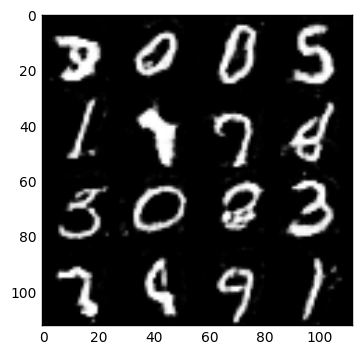

Epoch 2/2... Discriminator Loss: 1.2709... Generator Loss: 0.5949
Epoch 2/2... Discriminator Loss: 0.9463... Generator Loss: 1.6379
Epoch 2/2... Discriminator Loss: 1.1849... Generator Loss: 0.7469
Epoch 2/2... Discriminator Loss: 0.9421... Generator Loss: 1.0951
Epoch 2/2... Discriminator Loss: 0.7983... Generator Loss: 1.3221
Epoch 2/2... Discriminator Loss: 1.4970... Generator Loss: 0.5638
Epoch 2/2... Discriminator Loss: 0.9910... Generator Loss: 2.1141
Epoch 2/2... Discriminator Loss: 0.7184... Generator Loss: 1.4999
Epoch 2/2... Discriminator Loss: 0.9364... Generator Loss: 1.0481
Epoch 2/2... Discriminator Loss: 1.0183... Generator Loss: 0.9015
Epoch 2/2... Discriminator Loss: 0.8030... Generator Loss: 1.8355
Epoch 2/2... Discriminator Loss: 0.8251... Generator Loss: 1.1616
Epoch 2/2... Discriminator Loss: 0.8864... Generator Loss: 1.0677
Epoch 2/2... Discriminator Loss: 0.6960... Generator Loss: 1.7015
Epoch 2/2... Discriminator Loss: 0.8089... Generator Loss: 1.2811
Epoch 2/2.

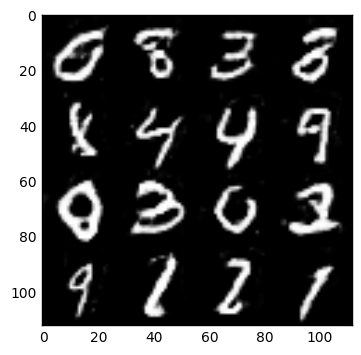

Epoch 2/2... Discriminator Loss: 1.1000... Generator Loss: 0.7263
Epoch 2/2... Discriminator Loss: 1.0917... Generator Loss: 1.5736
Epoch 2/2... Discriminator Loss: 1.4481... Generator Loss: 0.5173
Epoch 2/2... Discriminator Loss: 1.0125... Generator Loss: 1.3852
Epoch 2/2... Discriminator Loss: 1.3166... Generator Loss: 0.6451
Epoch 2/2... Discriminator Loss: 0.7771... Generator Loss: 2.0171
Epoch 2/2... Discriminator Loss: 1.0181... Generator Loss: 0.9861
Epoch 2/2... Discriminator Loss: 0.7655... Generator Loss: 1.4003
Epoch 2/2... Discriminator Loss: 0.7462... Generator Loss: 1.6074
Epoch 2/2... Discriminator Loss: 0.9073... Generator Loss: 0.9610
Epoch 2/2... Discriminator Loss: 0.7393... Generator Loss: 1.6099
Epoch 2/2... Discriminator Loss: 1.0437... Generator Loss: 0.9466
Epoch 2/2... Discriminator Loss: 0.7325... Generator Loss: 1.5757
Epoch 2/2... Discriminator Loss: 0.6839... Generator Loss: 1.5157
Epoch 2/2... Discriminator Loss: 0.8457... Generator Loss: 1.1747
Epoch 2/2.

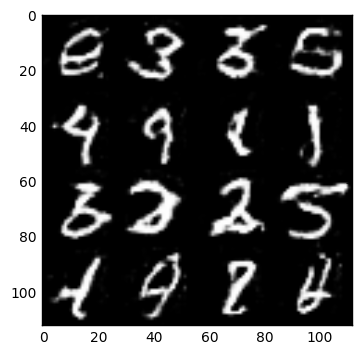

Epoch 2/2... Discriminator Loss: 0.9947... Generator Loss: 1.0734
Epoch 2/2... Discriminator Loss: 0.8671... Generator Loss: 1.1629
Epoch 2/2... Discriminator Loss: 0.8018... Generator Loss: 1.3288
Epoch 2/2... Discriminator Loss: 0.8037... Generator Loss: 1.4525
Epoch 2/2... Discriminator Loss: 1.0462... Generator Loss: 0.8228
Epoch 2/2... Discriminator Loss: 0.8149... Generator Loss: 1.3283
Epoch 2/2... Discriminator Loss: 0.6541... Generator Loss: 2.0165
Epoch 2/2... Discriminator Loss: 1.3460... Generator Loss: 0.6278
Epoch 2/2... Discriminator Loss: 0.7696... Generator Loss: 2.0714
Epoch 2/2... Discriminator Loss: 0.8662... Generator Loss: 1.1915
Epoch 2/2... Discriminator Loss: 0.9425... Generator Loss: 0.9273
Epoch 2/2... Discriminator Loss: 0.8092... Generator Loss: 1.3529
Epoch 2/2... Discriminator Loss: 0.7472... Generator Loss: 1.4518
Epoch 2/2... Discriminator Loss: 0.7190... Generator Loss: 1.4900
Epoch 2/2... Discriminator Loss: 0.8456... Generator Loss: 1.0866
Epoch 2/2.

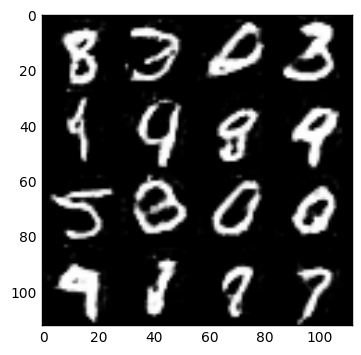

Epoch 2/2... Discriminator Loss: 0.6311... Generator Loss: 1.8251
Epoch 2/2... Discriminator Loss: 1.3844... Generator Loss: 0.5284
Epoch 2/2... Discriminator Loss: 0.9113... Generator Loss: 1.8208
Epoch 2/2... Discriminator Loss: 0.9033... Generator Loss: 1.0885
Epoch 2/2... Discriminator Loss: 0.8061... Generator Loss: 1.2282
Epoch 2/2... Discriminator Loss: 0.9377... Generator Loss: 1.2577
Epoch 2/2... Discriminator Loss: 1.2405... Generator Loss: 0.6672
Epoch 2/2... Discriminator Loss: 1.0717... Generator Loss: 0.8999
Epoch 2/2... Discriminator Loss: 0.8051... Generator Loss: 1.3334
Epoch 2/2... Discriminator Loss: 1.0091... Generator Loss: 1.0000
Epoch 2/2... Discriminator Loss: 1.0015... Generator Loss: 0.9840
Epoch 2/2... Discriminator Loss: 0.8743... Generator Loss: 1.3561
Epoch 2/2... Discriminator Loss: 0.7200... Generator Loss: 2.3477
Epoch 2/2... Discriminator Loss: 1.0400... Generator Loss: 0.8577
Epoch 2/2... Discriminator Loss: 0.9576... Generator Loss: 1.0288
Epoch 2/2.

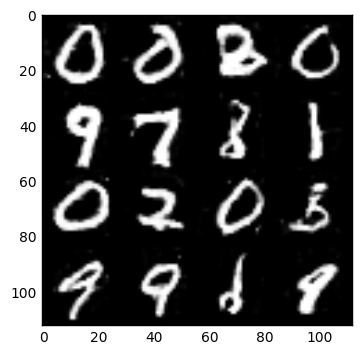

Epoch 2/2... Discriminator Loss: 0.6260... Generator Loss: 1.7364
Epoch 2/2... Discriminator Loss: 0.8801... Generator Loss: 1.1408
Epoch 2/2... Discriminator Loss: 0.8148... Generator Loss: 1.1834
Epoch 2/2... Discriminator Loss: 0.7895... Generator Loss: 1.6341
Epoch 2/2... Discriminator Loss: 0.6164... Generator Loss: 1.9058
Epoch 2/2... Discriminator Loss: 1.0373... Generator Loss: 0.8424
Epoch 2/2... Discriminator Loss: 0.7470... Generator Loss: 1.8762
Epoch 2/2... Discriminator Loss: 0.6952... Generator Loss: 1.6857
Epoch 2/2... Discriminator Loss: 0.9987... Generator Loss: 0.9257
Epoch 2/2... Discriminator Loss: 0.7075... Generator Loss: 1.8261
Epoch 2/2... Discriminator Loss: 0.7654... Generator Loss: 1.1961
Epoch 2/2... Discriminator Loss: 0.6359... Generator Loss: 1.5523
Epoch 2/2... Discriminator Loss: 0.7119... Generator Loss: 1.6432
Epoch 2/2... Discriminator Loss: 1.1020... Generator Loss: 0.7728
Epoch 2/2... Discriminator Loss: 0.8094... Generator Loss: 1.4984
Epoch 2/2.

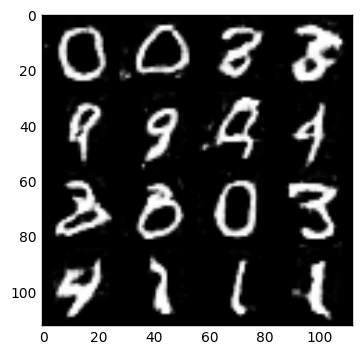

Epoch 2/2... Discriminator Loss: 0.7067... Generator Loss: 1.6677
Epoch 2/2... Discriminator Loss: 0.6079... Generator Loss: 1.8578
Epoch 2/2... Discriminator Loss: 1.1505... Generator Loss: 0.7499
Epoch 2/2... Discriminator Loss: 0.6477... Generator Loss: 1.7926
Epoch 2/2... Discriminator Loss: 0.7591... Generator Loss: 1.2784
Epoch 2/2... Discriminator Loss: 0.7601... Generator Loss: 1.4900
Epoch 2/2... Discriminator Loss: 0.9927... Generator Loss: 0.9953
Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 0.8732
Epoch 2/2... Discriminator Loss: 0.9604... Generator Loss: 1.4148
Epoch 2/2... Discriminator Loss: 0.8215... Generator Loss: 1.3111
Epoch 2/2... Discriminator Loss: 1.0161... Generator Loss: 1.0140
Epoch 2/2... Discriminator Loss: 0.7767... Generator Loss: 1.3919
Epoch 2/2... Discriminator Loss: 0.8873... Generator Loss: 1.5599
Epoch 2/2... Discriminator Loss: 0.9157... Generator Loss: 1.0613
Epoch 2/2... Discriminator Loss: 1.0605... Generator Loss: 0.8261
Epoch 2/2.

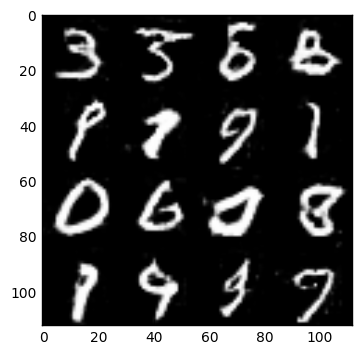

Epoch 2/2... Discriminator Loss: 0.9556... Generator Loss: 1.0573
Epoch 2/2... Discriminator Loss: 0.8679... Generator Loss: 1.1547
Epoch 2/2... Discriminator Loss: 0.7890... Generator Loss: 1.3218
Epoch 2/2... Discriminator Loss: 0.6531... Generator Loss: 1.7127
Epoch 2/2... Discriminator Loss: 1.0868... Generator Loss: 0.7358
Epoch 2/2... Discriminator Loss: 0.7339... Generator Loss: 1.4426
Epoch 2/2... Discriminator Loss: 0.6371... Generator Loss: 1.9937
Epoch 2/2... Discriminator Loss: 0.8566... Generator Loss: 1.1074
Epoch 2/2... Discriminator Loss: 0.9406... Generator Loss: 0.9472
Epoch 2/2... Discriminator Loss: 0.7164... Generator Loss: 1.5979
Epoch 2/2... Discriminator Loss: 0.6764... Generator Loss: 1.6582
Epoch 2/2... Discriminator Loss: 1.0280... Generator Loss: 0.8314
Epoch 2/2... Discriminator Loss: 0.8463... Generator Loss: 1.2717
Epoch 2/2... Discriminator Loss: 0.8763... Generator Loss: 1.3606
Epoch 2/2... Discriminator Loss: 0.9635... Generator Loss: 0.9945
Epoch 2/2.

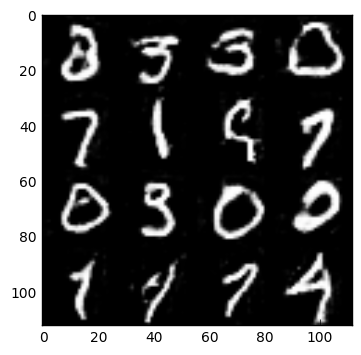

Epoch 2/2... Discriminator Loss: 0.6807... Generator Loss: 1.6517
Epoch 2/2... Discriminator Loss: 0.8530... Generator Loss: 1.2051
Epoch 2/2... Discriminator Loss: 1.0712... Generator Loss: 0.7756
Epoch 2/2... Discriminator Loss: 0.7711... Generator Loss: 1.4902
Epoch 2/2... Discriminator Loss: 0.8726... Generator Loss: 1.1943
Epoch 2/2... Discriminator Loss: 0.8507... Generator Loss: 1.2749
Epoch 2/2... Discriminator Loss: 0.8871... Generator Loss: 1.0400
Epoch 2/2... Discriminator Loss: 0.8231... Generator Loss: 1.3086
Epoch 2/2... Discriminator Loss: 0.7377... Generator Loss: 1.7601
Epoch 2/2... Discriminator Loss: 1.0494... Generator Loss: 0.8821
Epoch 2/2... Discriminator Loss: 0.8488... Generator Loss: 1.5096
Epoch 2/2... Discriminator Loss: 0.8751... Generator Loss: 1.1037
Epoch 2/2... Discriminator Loss: 0.7684... Generator Loss: 1.6096
Epoch 2/2... Discriminator Loss: 1.4226... Generator Loss: 0.4958
Epoch 2/2... Discriminator Loss: 0.9847... Generator Loss: 2.1259
Epoch 2/2.

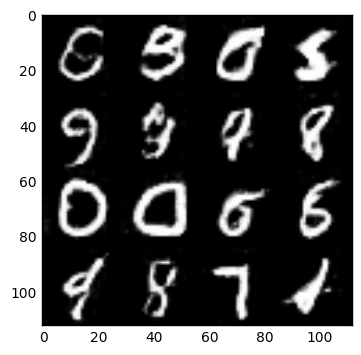

Epoch 2/2... Discriminator Loss: 1.4858... Generator Loss: 3.0577
Epoch 2/2... Discriminator Loss: 2.4212... Generator Loss: 0.2982
Epoch 2/2... Discriminator Loss: 0.6633... Generator Loss: 2.2049
Epoch 2/2... Discriminator Loss: 1.0442... Generator Loss: 2.6953
Epoch 2/2... Discriminator Loss: 1.1925... Generator Loss: 0.8080
Epoch 2/2... Discriminator Loss: 0.8252... Generator Loss: 1.3641
Epoch 2/2... Discriminator Loss: 0.8152... Generator Loss: 1.5115
Epoch 2/2... Discriminator Loss: 0.9949... Generator Loss: 1.0482
Epoch 2/2... Discriminator Loss: 0.9076... Generator Loss: 1.2096
Epoch 2/2... Discriminator Loss: 1.2131... Generator Loss: 0.7248
Epoch 2/2... Discriminator Loss: 0.9330... Generator Loss: 1.2213
Epoch 2/2... Discriminator Loss: 1.0685... Generator Loss: 1.1837
Epoch 2/2... Discriminator Loss: 0.8007... Generator Loss: 1.1950
Epoch 2/2... Discriminator Loss: 0.8094... Generator Loss: 1.3184
Epoch 2/2... Discriminator Loss: 0.6278... Generator Loss: 2.4220
Epoch 2/2.

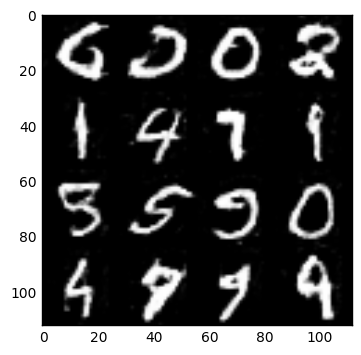

Epoch 2/2... Discriminator Loss: 1.3529... Generator Loss: 0.5460
Epoch 2/2... Discriminator Loss: 0.8519... Generator Loss: 2.2370
Epoch 2/2... Discriminator Loss: 0.7373... Generator Loss: 1.7322
Epoch 2/2... Discriminator Loss: 1.4135... Generator Loss: 0.5644
Epoch 2/2... Discriminator Loss: 1.0276... Generator Loss: 0.9118
Epoch 2/2... Discriminator Loss: 0.9846... Generator Loss: 2.4433
Epoch 2/2... Discriminator Loss: 1.4679... Generator Loss: 0.5966
Epoch 2/2... Discriminator Loss: 1.0325... Generator Loss: 2.1272
Epoch 2/2... Discriminator Loss: 2.4066... Generator Loss: 0.2130
Epoch 2/2... Discriminator Loss: 1.4064... Generator Loss: 2.8837
Epoch 2/2... Discriminator Loss: 0.7043... Generator Loss: 1.6895
Epoch 2/2... Discriminator Loss: 1.2782... Generator Loss: 0.7733
Epoch 2/2... Discriminator Loss: 0.8171... Generator Loss: 1.6795
Epoch 2/2... Discriminator Loss: 1.1733... Generator Loss: 0.9229
Epoch 2/2... Discriminator Loss: 0.8738... Generator Loss: 1.1892
Epoch 2/2.

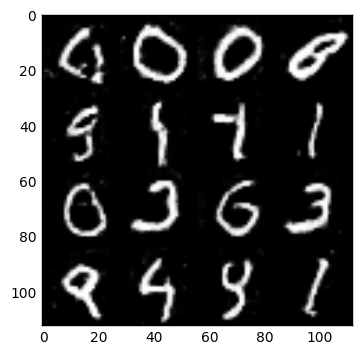

Epoch 2/2... Discriminator Loss: 1.2992... Generator Loss: 0.6925
Epoch 2/2... Discriminator Loss: 0.8423... Generator Loss: 1.4104
Epoch 2/2... Discriminator Loss: 1.2379... Generator Loss: 0.6934
Epoch 2/2... Discriminator Loss: 0.8454... Generator Loss: 1.8176
Epoch 2/2... Discriminator Loss: 0.7577... Generator Loss: 1.3757
Epoch 2/2... Discriminator Loss: 1.1552... Generator Loss: 0.7155
Epoch 2/2... Discriminator Loss: 0.8011... Generator Loss: 1.3749
Epoch 2/2... Discriminator Loss: 0.6210... Generator Loss: 2.1008
Epoch 2/2... Discriminator Loss: 1.0784... Generator Loss: 0.8445
Epoch 2/2... Discriminator Loss: 0.8492... Generator Loss: 1.3177
Epoch 2/2... Discriminator Loss: 0.7476... Generator Loss: 1.4367
Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 1.3560
Epoch 2/2... Discriminator Loss: 1.0027... Generator Loss: 0.8585
Epoch 2/2... Discriminator Loss: 0.8546... Generator Loss: 1.2931
Epoch 2/2... Discriminator Loss: 0.7861... Generator Loss: 1.4406
Epoch 2/2.

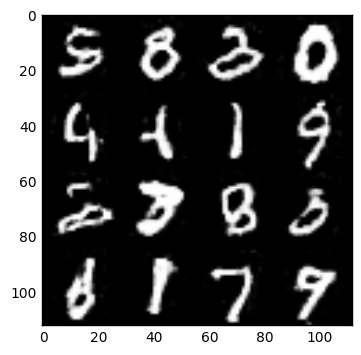

Epoch 2/2... Discriminator Loss: 0.8736... Generator Loss: 1.7830
Epoch 2/2... Discriminator Loss: 0.7429... Generator Loss: 1.3880
Epoch 2/2... Discriminator Loss: 0.6974... Generator Loss: 1.4496
Epoch 2/2... Discriminator Loss: 0.8125... Generator Loss: 1.1685
Epoch 2/2... Discriminator Loss: 0.7000... Generator Loss: 1.5878
Epoch 2/2... Discriminator Loss: 0.9402... Generator Loss: 0.9305
Epoch 2/2... Discriminator Loss: 0.8563... Generator Loss: 1.1931
Epoch 2/2... Discriminator Loss: 0.6999... Generator Loss: 1.6917
Epoch 2/2... Discriminator Loss: 0.6199... Generator Loss: 1.6333
Epoch 2/2... Discriminator Loss: 1.9235... Generator Loss: 0.3059
Epoch 2/2... Discriminator Loss: 2.9697... Generator Loss: 2.8350
Epoch 2/2... Discriminator Loss: 2.2242... Generator Loss: 0.2984
Epoch 2/2... Discriminator Loss: 5.3916... Generator Loss: 6.2199
Epoch 2/2... Discriminator Loss: 2.0296... Generator Loss: 0.4450
Epoch 2/2... Discriminator Loss: 1.1882... Generator Loss: 1.3960
Epoch 2/2.

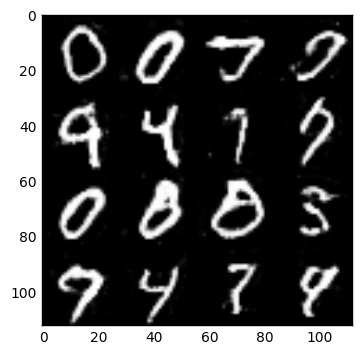

Epoch 2/2... Discriminator Loss: 0.8043... Generator Loss: 1.2289
Epoch 2/2... Discriminator Loss: 0.9490... Generator Loss: 1.0058
Epoch 2/2... Discriminator Loss: 0.7271... Generator Loss: 1.7421
Epoch 2/2... Discriminator Loss: 0.8836... Generator Loss: 1.0153
Epoch 2/2... Discriminator Loss: 1.1734... Generator Loss: 0.7176
Epoch 2/2... Discriminator Loss: 0.8747... Generator Loss: 1.2371
Epoch 2/2... Discriminator Loss: 0.7775... Generator Loss: 2.0995
Epoch 2/2... Discriminator Loss: 0.8641... Generator Loss: 1.0346
Epoch 2/2... Discriminator Loss: 1.2412... Generator Loss: 0.6800
Epoch 2/2... Discriminator Loss: 0.6516... Generator Loss: 1.8079
Epoch 2/2... Discriminator Loss: 0.7290... Generator Loss: 1.5690
Epoch 2/2... Discriminator Loss: 1.0416... Generator Loss: 0.8477
Epoch 2/2... Discriminator Loss: 0.9747... Generator Loss: 0.9755
Epoch 2/2... Discriminator Loss: 0.7574... Generator Loss: 1.7459
Epoch 2/2... Discriminator Loss: 1.2287... Generator Loss: 0.6761
Epoch 2/2.

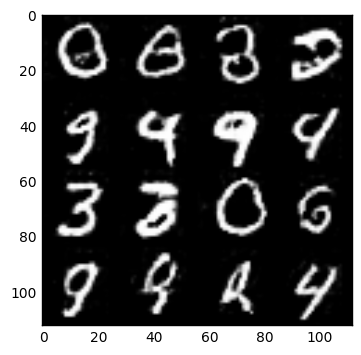

Epoch 2/2... Discriminator Loss: 0.7454... Generator Loss: 1.3733
Epoch 2/2... Discriminator Loss: 0.8422... Generator Loss: 1.1827
Epoch 2/2... Discriminator Loss: 1.0391... Generator Loss: 0.8874
Epoch 2/2... Discriminator Loss: 0.8056... Generator Loss: 1.2734
Epoch 2/2... Discriminator Loss: 0.6233... Generator Loss: 1.8194
Epoch 2/2... Discriminator Loss: 0.7667... Generator Loss: 1.3178
Epoch 2/2... Discriminator Loss: 1.0123... Generator Loss: 0.9080
Epoch 2/2... Discriminator Loss: 0.7275... Generator Loss: 1.8874
Epoch 2/2... Discriminator Loss: 1.1289... Generator Loss: 0.7463
Epoch 2/2... Discriminator Loss: 0.8342... Generator Loss: 1.1481
Epoch 2/2... Discriminator Loss: 0.8962... Generator Loss: 1.7182
Epoch 2/2... Discriminator Loss: 0.7718... Generator Loss: 1.3802
Epoch 2/2... Discriminator Loss: 1.3035... Generator Loss: 0.6591
Epoch 2/2... Discriminator Loss: 0.7796... Generator Loss: 1.3709
Epoch 2/2... Discriminator Loss: 0.7190... Generator Loss: 1.6471
Epoch 2/2.

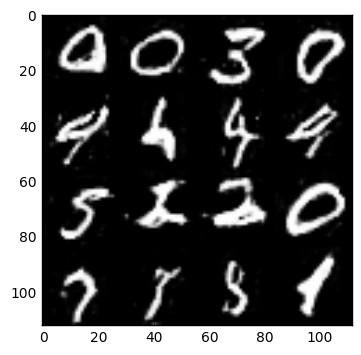

Epoch 2/2... Discriminator Loss: 0.6740... Generator Loss: 1.8235
Epoch 2/2... Discriminator Loss: 0.9758... Generator Loss: 0.8927
Epoch 2/2... Discriminator Loss: 0.7531... Generator Loss: 1.4686
Epoch 2/2... Discriminator Loss: 0.9532... Generator Loss: 1.0247
Epoch 2/2... Discriminator Loss: 0.7618... Generator Loss: 1.3855
Epoch 2/2... Discriminator Loss: 1.0456... Generator Loss: 0.9791
Epoch 2/2... Discriminator Loss: 0.9041... Generator Loss: 1.5492
Epoch 2/2... Discriminator Loss: 0.9119... Generator Loss: 1.1217
Epoch 2/2... Discriminator Loss: 1.2614... Generator Loss: 0.6524
Epoch 2/2... Discriminator Loss: 0.8960... Generator Loss: 1.2502
Epoch 2/2... Discriminator Loss: 0.7507... Generator Loss: 1.4762
Epoch 2/2... Discriminator Loss: 0.9788... Generator Loss: 1.0378
Epoch 2/2... Discriminator Loss: 1.4153... Generator Loss: 0.4889
Epoch 2/2... Discriminator Loss: 0.9170... Generator Loss: 2.0759
Epoch 2/2... Discriminator Loss: 0.7407... Generator Loss: 1.5607
Epoch 2/2.

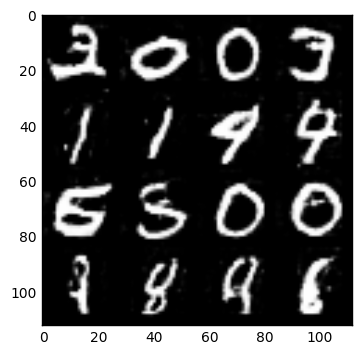

Epoch 2/2... Discriminator Loss: 1.1064... Generator Loss: 0.7498
Epoch 2/2... Discriminator Loss: 0.7634... Generator Loss: 1.4245
Epoch 2/2... Discriminator Loss: 0.7291... Generator Loss: 1.5249
Epoch 2/2... Discriminator Loss: 0.7654... Generator Loss: 1.3397
Epoch 2/2... Discriminator Loss: 1.0436... Generator Loss: 0.8428
Epoch 2/2... Discriminator Loss: 0.9663... Generator Loss: 0.9860
Epoch 2/2... Discriminator Loss: 0.9566... Generator Loss: 1.1793
Epoch 2/2... Discriminator Loss: 0.6870... Generator Loss: 1.8373
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 0.8041
Epoch 2/2... Discriminator Loss: 1.2341... Generator Loss: 2.5433
Epoch 2/2... Discriminator Loss: 1.5282... Generator Loss: 0.4656
Epoch 2/2... Discriminator Loss: 1.0793... Generator Loss: 1.9491
Epoch 2/2... Discriminator Loss: 1.4621... Generator Loss: 0.6154
Epoch 2/2... Discriminator Loss: 0.9115... Generator Loss: 1.6531
Epoch 2/2... Discriminator Loss: 1.1582... Generator Loss: 0.8855
Epoch 2/2.

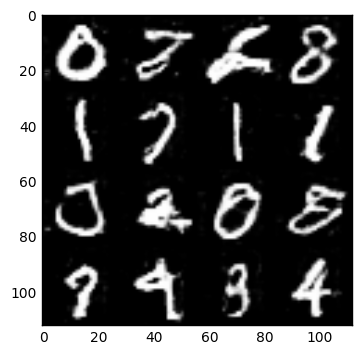

Epoch 2/2... Discriminator Loss: 0.7966... Generator Loss: 1.4159
Epoch 2/2... Discriminator Loss: 0.9808... Generator Loss: 1.0735
Epoch 2/2... Discriminator Loss: 0.9897... Generator Loss: 0.9063
Epoch 2/2... Discriminator Loss: 0.7656... Generator Loss: 1.5871
Epoch 2/2... Discriminator Loss: 0.8275... Generator Loss: 1.3006
Epoch 2/2... Discriminator Loss: 1.1718... Generator Loss: 0.8385
Epoch 2/2... Discriminator Loss: 0.9328... Generator Loss: 1.1028
Epoch 2/2... Discriminator Loss: 0.7930... Generator Loss: 1.6039
Epoch 2/2... Discriminator Loss: 1.0976... Generator Loss: 0.7587
Epoch 2/2... Discriminator Loss: 0.7648... Generator Loss: 1.5655
Epoch 2/2... Discriminator Loss: 0.7258... Generator Loss: 1.4472
Epoch 2/2... Discriminator Loss: 1.1471... Generator Loss: 0.7755
Epoch 2/2... Discriminator Loss: 0.7250... Generator Loss: 1.9181
Epoch 2/2... Discriminator Loss: 0.8726... Generator Loss: 1.1594
Epoch 2/2... Discriminator Loss: 0.9400... Generator Loss: 0.9984
Epoch 2/2.

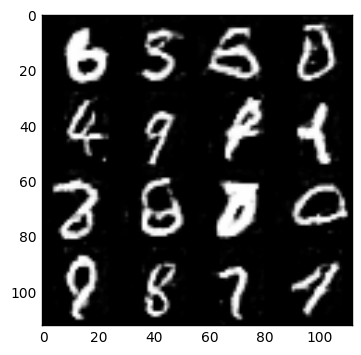

Epoch 2/2... Discriminator Loss: 0.8008... Generator Loss: 1.2841
Epoch 2/2... Discriminator Loss: 0.5960... Generator Loss: 1.7522
Epoch 2/2... Discriminator Loss: 0.8577... Generator Loss: 1.1377
Epoch 2/2... Discriminator Loss: 1.0520... Generator Loss: 0.9026
Epoch 2/2... Discriminator Loss: 0.7220... Generator Loss: 2.2314
Epoch 2/2... Discriminator Loss: 1.0150... Generator Loss: 1.0500
Epoch 2/2... Discriminator Loss: 1.1529... Generator Loss: 0.7238
Epoch 2/2... Discriminator Loss: 1.1209... Generator Loss: 0.8707
Epoch 2/2... Discriminator Loss: 0.7950... Generator Loss: 1.8151
Epoch 2/2... Discriminator Loss: 1.2374... Generator Loss: 0.6728
Epoch 2/2... Discriminator Loss: 0.8731... Generator Loss: 1.2948
Epoch 2/2... Discriminator Loss: 0.8099... Generator Loss: 1.7812
Epoch 2/2... Discriminator Loss: 1.1775... Generator Loss: 0.8596
Epoch 2/2... Discriminator Loss: 0.7733... Generator Loss: 1.4453
Epoch 2/2... Discriminator Loss: 0.7176... Generator Loss: 1.4995
Epoch 2/2.

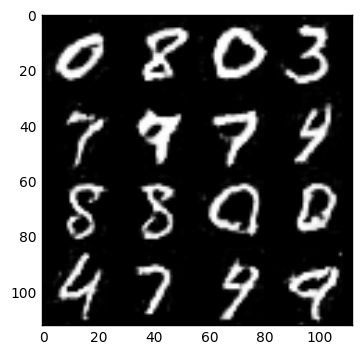

Epoch 2/2... Discriminator Loss: 0.8019... Generator Loss: 1.3531
Epoch 2/2... Discriminator Loss: 0.7370... Generator Loss: 1.4795
Epoch 2/2... Discriminator Loss: 0.8741... Generator Loss: 1.0836
Epoch 2/2... Discriminator Loss: 0.7487... Generator Loss: 1.5569
Epoch 2/2... Discriminator Loss: 0.7418... Generator Loss: 1.3972
Epoch 2/2... Discriminator Loss: 0.9482... Generator Loss: 1.0328
Epoch 2/2... Discriminator Loss: 0.7287... Generator Loss: 1.5394
Epoch 2/2... Discriminator Loss: 1.0087... Generator Loss: 0.9713
Epoch 2/2... Discriminator Loss: 0.8037... Generator Loss: 1.4631
Epoch 2/2... Discriminator Loss: 0.8120... Generator Loss: 1.2632
Epoch 2/2... Discriminator Loss: 0.8958... Generator Loss: 1.0084
Epoch 2/2... Discriminator Loss: 1.0190... Generator Loss: 0.8841
Epoch 2/2... Discriminator Loss: 0.9265... Generator Loss: 1.6346
Epoch 2/2... Discriminator Loss: 0.8406... Generator Loss: 1.1657
Epoch 2/2... Discriminator Loss: 1.1065... Generator Loss: 0.7824
Epoch 2/2.

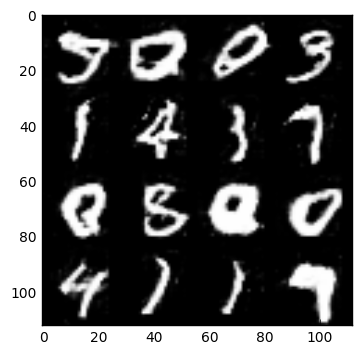

Epoch 2/2... Discriminator Loss: 1.5132... Generator Loss: 0.6323
Epoch 2/2... Discriminator Loss: 0.8929... Generator Loss: 1.5397
Epoch 2/2... Discriminator Loss: 0.7885... Generator Loss: 2.1958
Epoch 2/2... Discriminator Loss: 1.2357... Generator Loss: 0.7019
Epoch 2/2... Discriminator Loss: 0.7241... Generator Loss: 1.5779
Epoch 2/2... Discriminator Loss: 1.1584... Generator Loss: 0.7857
Epoch 2/2... Discriminator Loss: 0.7919... Generator Loss: 1.6783
Epoch 2/2... Discriminator Loss: 0.6673... Generator Loss: 1.8061
Epoch 2/2... Discriminator Loss: 1.8997... Generator Loss: 0.3182
Epoch 2/2... Discriminator Loss: 1.0808... Generator Loss: 1.6374
Epoch 2/2... Discriminator Loss: 0.7714... Generator Loss: 1.8256
Epoch 2/2... Discriminator Loss: 0.9417... Generator Loss: 1.0248
Epoch 2/2... Discriminator Loss: 1.1775... Generator Loss: 0.7626
Epoch 2/2... Discriminator Loss: 0.9708... Generator Loss: 1.2396
Epoch 2/2... Discriminator Loss: 0.6416... Generator Loss: 2.0888
Epoch 2/2.

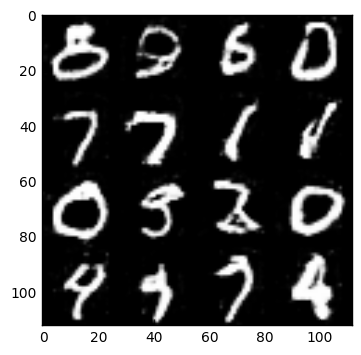

Epoch 2/2... Discriminator Loss: 0.8170... Generator Loss: 2.2956


In [ ]:
batch_size = 16
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 3.2521... Generator Loss: 0.0675
Epoch 1/1... Discriminator Loss: 1.6859... Generator Loss: 0.3439
Epoch 1/1... Discriminator Loss: 1.5748... Generator Loss: 0.4270
Epoch 1/1... Discriminator Loss: 1.8360... Generator Loss: 0.3260
Epoch 1/1... Discriminator Loss: 1.6103... Generator Loss: 0.4361
Epoch 1/1... Discriminator Loss: 1.1155... Generator Loss: 0.8367
Epoch 1/1... Discriminator Loss: 1.3263... Generator Loss: 0.5880
Epoch 1/1... Discriminator Loss: 2.1068... Generator Loss: 0.2686
Epoch 1/1... Discriminator Loss: 0.7798... Generator Loss: 1.2081
Epoch 1/1... Discriminator Loss: 0.9428... Generator Loss: 0.9394
Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 0.6994
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 0.9175
Epoch 1/1... Discriminator Loss: 0.4998... Generator Loss: 2.2871
Epoch 1/1... Discriminator Loss: 0.4953... Generator Loss: 2.9705
Epoch 1/1... Discriminator Loss: 1.4398... Generator Loss: 0.6521
Epoch 1/1.

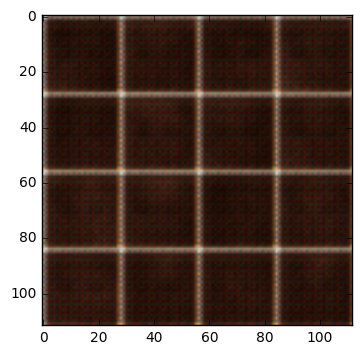

Epoch 1/1... Discriminator Loss: 1.0566... Generator Loss: 0.9943
Epoch 1/1... Discriminator Loss: 1.1475... Generator Loss: 1.0471
Epoch 1/1... Discriminator Loss: 1.4390... Generator Loss: 0.6444
Epoch 1/1... Discriminator Loss: 0.9826... Generator Loss: 2.2052
Epoch 1/1... Discriminator Loss: 1.3358... Generator Loss: 0.7503
Epoch 1/1... Discriminator Loss: 0.7230... Generator Loss: 1.7559
Epoch 1/1... Discriminator Loss: 0.8993... Generator Loss: 1.4850
Epoch 1/1... Discriminator Loss: 1.5603... Generator Loss: 0.4202
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 2.8548
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 1.0455
Epoch 1/1... Discriminator Loss: 0.8089... Generator Loss: 1.6590
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.9306
Epoch 1/1... Discriminator Loss: 1.2387... Generator Loss: 0.6938
Epoch 1/1... Discriminator Loss: 0.7343... Generator Loss: 2.1630
Epoch 1/1... Discriminator Loss: 0.7021... Generator Loss: 1.6043
Epoch 1/1.

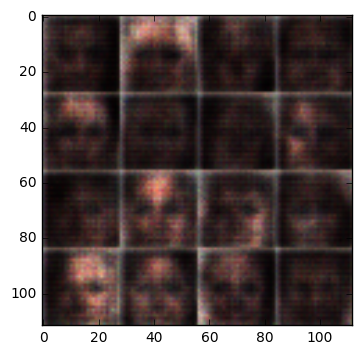

Epoch 1/1... Discriminator Loss: 1.1007... Generator Loss: 0.7732
Epoch 1/1... Discriminator Loss: 0.9904... Generator Loss: 3.7849
Epoch 1/1... Discriminator Loss: 1.3081... Generator Loss: 0.7364
Epoch 1/1... Discriminator Loss: 0.7872... Generator Loss: 1.5030
Epoch 1/1... Discriminator Loss: 0.7195... Generator Loss: 2.4866
Epoch 1/1... Discriminator Loss: 1.4579... Generator Loss: 0.4732
Epoch 1/1... Discriminator Loss: 0.7277... Generator Loss: 1.4593
Epoch 1/1... Discriminator Loss: 0.6648... Generator Loss: 2.0279
Epoch 1/1... Discriminator Loss: 1.0422... Generator Loss: 0.8876
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 0.6078
Epoch 1/1... Discriminator Loss: 0.9097... Generator Loss: 1.1710
Epoch 1/1... Discriminator Loss: 0.8392... Generator Loss: 1.5223
Epoch 1/1... Discriminator Loss: 1.1118... Generator Loss: 0.7801
Epoch 1/1... Discriminator Loss: 1.0540... Generator Loss: 0.8329
Epoch 1/1... Discriminator Loss: 0.7951... Generator Loss: 1.5711
Epoch 1/1.

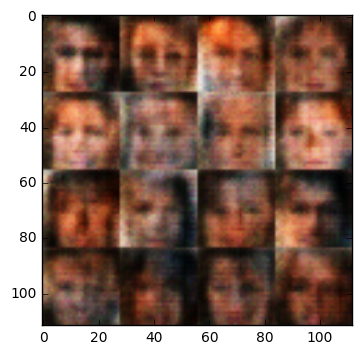

Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.6129
Epoch 1/1... Discriminator Loss: 1.1012... Generator Loss: 0.7960
Epoch 1/1... Discriminator Loss: 1.1851... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.4153... Generator Loss: 0.5013
Epoch 1/1... Discriminator Loss: 1.1980... Generator Loss: 0.8943
Epoch 1/1... Discriminator Loss: 1.0959... Generator Loss: 0.7915
Epoch 1/1... Discriminator Loss: 1.0891... Generator Loss: 0.7949
Epoch 1/1... Discriminator Loss: 1.1780... Generator Loss: 0.8113
Epoch 1/1... Discriminator Loss: 0.8594... Generator Loss: 1.1126
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.4988
Epoch 1/1... Discriminator Loss: 0.8987... Generator Loss: 1.5217
Epoch 1/1... Discriminator Loss: 1.0896... Generator Loss: 0.8365
Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.6152
Epoch 1/1... Discriminator Loss: 0.8212... Generator Loss: 1.4534
Epoch 1/1... Discriminator Loss: 0.7141... Generator Loss: 1.7155
Epoch 1/1.

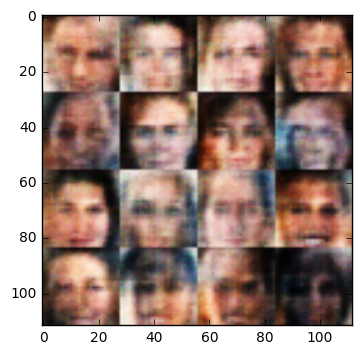

Epoch 1/1... Discriminator Loss: 1.2019... Generator Loss: 0.6864
Epoch 1/1... Discriminator Loss: 1.0877... Generator Loss: 1.0492
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.6154
Epoch 1/1... Discriminator Loss: 1.2169... Generator Loss: 0.7499
Epoch 1/1... Discriminator Loss: 1.1089... Generator Loss: 0.8723
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 0.8713
Epoch 1/1... Discriminator Loss: 0.9153... Generator Loss: 1.1770
Epoch 1/1... Discriminator Loss: 1.5384... Generator Loss: 0.4470
Epoch 1/1... Discriminator Loss: 1.2862... Generator Loss: 0.7133
Epoch 1/1... Discriminator Loss: 1.0965... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.6064... Generator Loss: 0.3772
Epoch 1/1... Discriminator Loss: 0.9676... Generator Loss: 1.6254
Epoch 1/1... Discriminator Loss: 1.5912... Generator Loss: 0.3966
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 2.6884
Epoch 1/1... Discriminator Loss: 1.5048... Generator Loss: 0.4651
Epoch 1/1.

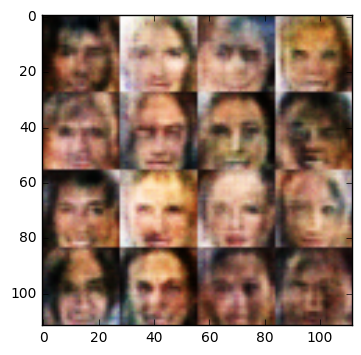

Epoch 1/1... Discriminator Loss: 1.5009... Generator Loss: 0.5263
Epoch 1/1... Discriminator Loss: 1.0281... Generator Loss: 1.1076
Epoch 1/1... Discriminator Loss: 1.1212... Generator Loss: 0.8173
Epoch 1/1... Discriminator Loss: 1.2986... Generator Loss: 0.5860
Epoch 1/1... Discriminator Loss: 1.2346... Generator Loss: 0.8775
Epoch 1/1... Discriminator Loss: 0.9039... Generator Loss: 1.2962
Epoch 1/1... Discriminator Loss: 1.0657... Generator Loss: 0.8951
Epoch 1/1... Discriminator Loss: 1.1356... Generator Loss: 0.7374
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 0.6617
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.5916
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.9045
Epoch 1/1... Discriminator Loss: 0.9919... Generator Loss: 1.0510
Epoch 1/1... Discriminator Loss: 1.0413... Generator Loss: 1.0421
Epoch 1/1... Discriminator Loss: 1.4984... Generator Loss: 0.4284
Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 1.2157
Epoch 1/1.

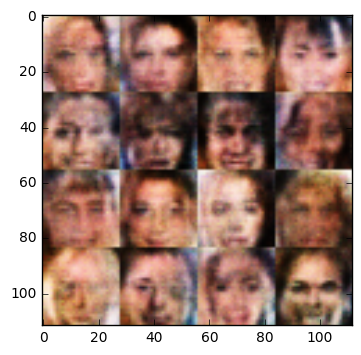

Epoch 1/1... Discriminator Loss: 1.4791... Generator Loss: 0.8701
Epoch 1/1... Discriminator Loss: 1.3094... Generator Loss: 1.5387
Epoch 1/1... Discriminator Loss: 1.4885... Generator Loss: 0.5232
Epoch 1/1... Discriminator Loss: 0.7722... Generator Loss: 1.9483
Epoch 1/1... Discriminator Loss: 2.0611... Generator Loss: 0.3330
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 1.7720
Epoch 1/1... Discriminator Loss: 1.1444... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.6567... Generator Loss: 0.4077
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 1.2960
Epoch 1/1... Discriminator Loss: 1.1941... Generator Loss: 0.9680
Epoch 1/1... Discriminator Loss: 1.1564... Generator Loss: 0.8937
Epoch 1/1... Discriminator Loss: 0.9433... Generator Loss: 1.3051
Epoch 1/1... Discriminator Loss: 1.4693... Generator Loss: 0.4939
Epoch 1/1... Discriminator Loss: 1.2142... Generator Loss: 0.8088
Epoch 1/1... Discriminator Loss: 1.0235... Generator Loss: 1.1933
Epoch 1/1.

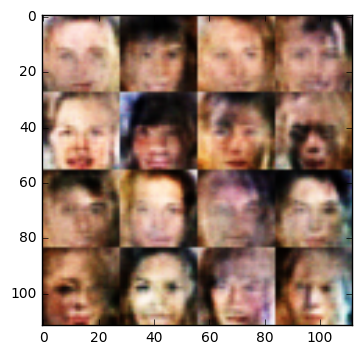

Epoch 1/1... Discriminator Loss: 1.6985... Generator Loss: 0.3929
Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 2.2687
Epoch 1/1... Discriminator Loss: 2.1816... Generator Loss: 0.2323
Epoch 1/1... Discriminator Loss: 1.2549... Generator Loss: 1.8954
Epoch 1/1... Discriminator Loss: 0.8930... Generator Loss: 1.0534
Epoch 1/1... Discriminator Loss: 2.3451... Generator Loss: 0.1718
Epoch 1/1... Discriminator Loss: 0.9852... Generator Loss: 3.3748
Epoch 1/1... Discriminator Loss: 1.6235... Generator Loss: 0.4739
Epoch 1/1... Discriminator Loss: 0.9256... Generator Loss: 1.3041
Epoch 1/1... Discriminator Loss: 1.5410... Generator Loss: 0.5514
Epoch 1/1... Discriminator Loss: 1.6624... Generator Loss: 1.0364
Epoch 1/1... Discriminator Loss: 1.6034... Generator Loss: 0.4404
Epoch 1/1... Discriminator Loss: 1.5522... Generator Loss: 0.5228
Epoch 1/1... Discriminator Loss: 1.8805... Generator Loss: 0.2970
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.9640
Epoch 1/1.

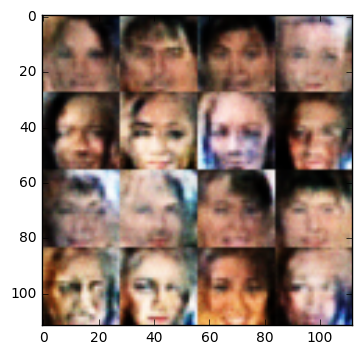

Epoch 1/1... Discriminator Loss: 0.7116... Generator Loss: 1.5243
Epoch 1/1... Discriminator Loss: 0.6183... Generator Loss: 1.7836
Epoch 1/1... Discriminator Loss: 0.8614... Generator Loss: 1.1072
Epoch 1/1... Discriminator Loss: 0.9112... Generator Loss: 1.0112
Epoch 1/1... Discriminator Loss: 0.8678... Generator Loss: 1.0674
Epoch 1/1... Discriminator Loss: 0.6187... Generator Loss: 2.4318
Epoch 1/1... Discriminator Loss: 1.9038... Generator Loss: 0.2868
Epoch 1/1... Discriminator Loss: 1.1217... Generator Loss: 2.0337
Epoch 1/1... Discriminator Loss: 0.9517... Generator Loss: 0.9852
Epoch 1/1... Discriminator Loss: 0.6790... Generator Loss: 1.7343
Epoch 1/1... Discriminator Loss: 0.8060... Generator Loss: 1.2320
Epoch 1/1... Discriminator Loss: 0.6068... Generator Loss: 1.9070
Epoch 1/1... Discriminator Loss: 1.1762... Generator Loss: 0.6725
Epoch 1/1... Discriminator Loss: 0.8722... Generator Loss: 2.9349
Epoch 1/1... Discriminator Loss: 0.9377... Generator Loss: 0.9625
Epoch 1/1.

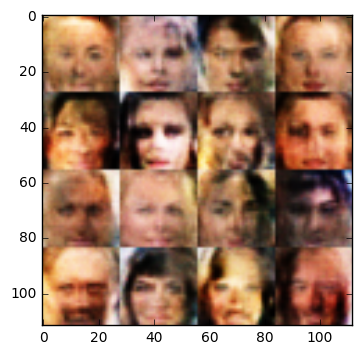

Epoch 1/1... Discriminator Loss: 2.1242... Generator Loss: 0.2277
Epoch 1/1... Discriminator Loss: 0.9548... Generator Loss: 3.0247
Epoch 1/1... Discriminator Loss: 0.4616... Generator Loss: 2.9216
Epoch 1/1... Discriminator Loss: 2.8230... Generator Loss: 0.1066
Epoch 1/1... Discriminator Loss: 1.1406... Generator Loss: 1.7802
Epoch 1/1... Discriminator Loss: 0.9747... Generator Loss: 1.4712
Epoch 1/1... Discriminator Loss: 1.0680... Generator Loss: 0.9886
Epoch 1/1... Discriminator Loss: 0.5827... Generator Loss: 2.1225
Epoch 1/1... Discriminator Loss: 0.6456... Generator Loss: 1.9458
Epoch 1/1... Discriminator Loss: 0.8202... Generator Loss: 1.1347
Epoch 1/1... Discriminator Loss: 0.8628... Generator Loss: 1.1340
Epoch 1/1... Discriminator Loss: 0.6063... Generator Loss: 2.8142
Epoch 1/1... Discriminator Loss: 1.2540... Generator Loss: 0.6358
Epoch 1/1... Discriminator Loss: 0.5915... Generator Loss: 2.3330
Epoch 1/1... Discriminator Loss: 0.6801... Generator Loss: 1.6727
Epoch 1/1.

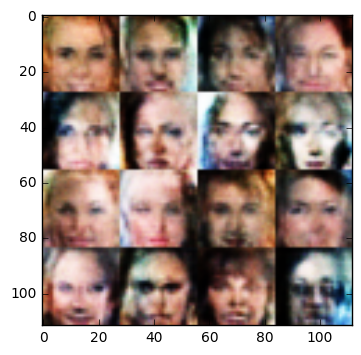

Epoch 1/1... Discriminator Loss: 1.2525... Generator Loss: 0.7116
Epoch 1/1... Discriminator Loss: 0.5366... Generator Loss: 5.5563
Epoch 1/1... Discriminator Loss: 1.4890... Generator Loss: 0.4972
Epoch 1/1... Discriminator Loss: 0.6688... Generator Loss: 2.7239
Epoch 1/1... Discriminator Loss: 0.3851... Generator Loss: 4.1051
Epoch 1/1... Discriminator Loss: 2.3252... Generator Loss: 0.1773
Epoch 1/1... Discriminator Loss: 0.8350... Generator Loss: 6.3347
Epoch 1/1... Discriminator Loss: 0.9930... Generator Loss: 1.0431
Epoch 1/1... Discriminator Loss: 1.1046... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 0.4627... Generator Loss: 4.7886
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 0.8312
Epoch 1/1... Discriminator Loss: 0.6055... Generator Loss: 2.1380
Epoch 1/1... Discriminator Loss: 0.3995... Generator Loss: 4.2055
Epoch 1/1... Discriminator Loss: 1.7953... Generator Loss: 0.3128
Epoch 1/1... Discriminator Loss: 1.1489... Generator Loss: 1.6103
Epoch 1/1.

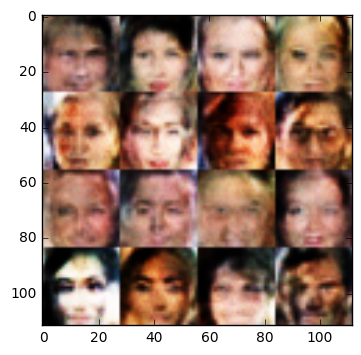

Epoch 1/1... Discriminator Loss: 0.4261... Generator Loss: 7.1770
Epoch 1/1... Discriminator Loss: 0.7490... Generator Loss: 1.3542
Epoch 1/1... Discriminator Loss: 0.3488... Generator Loss: 6.9569
Epoch 1/1... Discriminator Loss: 0.3608... Generator Loss: 5.6744
Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.5856
Epoch 1/1... Discriminator Loss: 0.5110... Generator Loss: 8.8875
Epoch 1/1... Discriminator Loss: 0.3621... Generator Loss: 5.7406
Epoch 1/1... Discriminator Loss: 1.8092... Generator Loss: 0.3936
Epoch 1/1... Discriminator Loss: 0.8389... Generator Loss: 3.0066
Epoch 1/1... Discriminator Loss: 0.4743... Generator Loss: 5.7800
Epoch 1/1... Discriminator Loss: 1.3757... Generator Loss: 0.6176
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 1.2529
Epoch 1/1... Discriminator Loss: 0.4856... Generator Loss: 4.5543
Epoch 1/1... Discriminator Loss: 1.0951... Generator Loss: 0.8335
Epoch 1/1... Discriminator Loss: 0.4687... Generator Loss: 3.7964
Epoch 1/1.

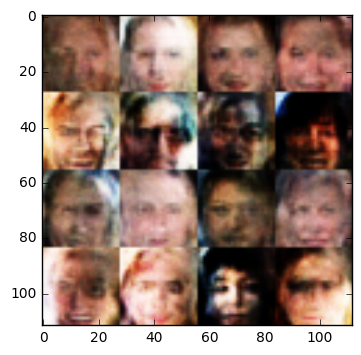

Epoch 1/1... Discriminator Loss: 0.4104... Generator Loss: 5.9032
Epoch 1/1... Discriminator Loss: 1.1657... Generator Loss: 0.7250
Epoch 1/1... Discriminator Loss: 0.3936... Generator Loss: 7.8546
Epoch 1/1... Discriminator Loss: 0.3908... Generator Loss: 5.0634
Epoch 1/1... Discriminator Loss: 1.1379... Generator Loss: 0.8222
Epoch 1/1... Discriminator Loss: 0.6830... Generator Loss: 2.5608
Epoch 1/1... Discriminator Loss: 0.4162... Generator Loss: 5.4075
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.6260
Epoch 1/1... Discriminator Loss: 0.6307... Generator Loss: 5.0817
Epoch 1/1... Discriminator Loss: 0.4377... Generator Loss: 3.2137
Epoch 1/1... Discriminator Loss: 0.6444... Generator Loss: 1.6229
Epoch 1/1... Discriminator Loss: 0.4394... Generator Loss: 3.5944
Epoch 1/1... Discriminator Loss: 0.5851... Generator Loss: 1.8155
Epoch 1/1... Discriminator Loss: 0.4522... Generator Loss: 4.1732
Epoch 1/1... Discriminator Loss: 0.5056... Generator Loss: 2.3745
Epoch 1/1.

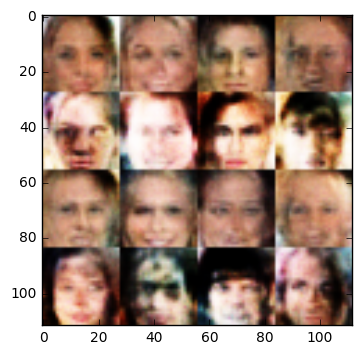

Epoch 1/1... Discriminator Loss: 0.7411... Generator Loss: 7.3968
Epoch 1/1... Discriminator Loss: 0.4997... Generator Loss: 3.0231
Epoch 1/1... Discriminator Loss: 0.3871... Generator Loss: 4.2224
Epoch 1/1... Discriminator Loss: 1.3393... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 0.4075... Generator Loss: 3.9349
Epoch 1/1... Discriminator Loss: 0.7126... Generator Loss: 1.7371
Epoch 1/1... Discriminator Loss: 0.3922... Generator Loss: 3.9475
Epoch 1/1... Discriminator Loss: 1.7568... Generator Loss: 0.4060
Epoch 1/1... Discriminator Loss: 0.5593... Generator Loss: 7.0993
Epoch 1/1... Discriminator Loss: 0.3926... Generator Loss: 5.0418
Epoch 1/1... Discriminator Loss: 1.0914... Generator Loss: 1.1076
Epoch 1/1... Discriminator Loss: 0.3856... Generator Loss: 7.0741
Epoch 1/1... Discriminator Loss: 0.4211... Generator Loss: 4.3650
Epoch 1/1... Discriminator Loss: 1.0139... Generator Loss: 0.9998
Epoch 1/1... Discriminator Loss: 0.6892... Generator Loss: 1.5875
Epoch 1/1.

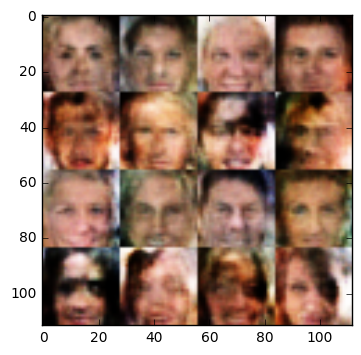

Epoch 1/1... Discriminator Loss: 0.4425... Generator Loss: 3.1116
Epoch 1/1... Discriminator Loss: 0.3690... Generator Loss: 5.2874
Epoch 1/1... Discriminator Loss: 0.8319... Generator Loss: 1.2661
Epoch 1/1... Discriminator Loss: 0.4075... Generator Loss: 4.4393
Epoch 1/1... Discriminator Loss: 0.4187... Generator Loss: 4.2877
Epoch 1/1... Discriminator Loss: 0.4986... Generator Loss: 2.3883
Epoch 1/1... Discriminator Loss: 0.4191... Generator Loss: 4.7731
Epoch 1/1... Discriminator Loss: 0.4498... Generator Loss: 2.8986
Epoch 1/1... Discriminator Loss: 0.3904... Generator Loss: 4.4602
Epoch 1/1... Discriminator Loss: 0.4619... Generator Loss: 3.0564
Epoch 1/1... Discriminator Loss: 0.4017... Generator Loss: 3.6017
Epoch 1/1... Discriminator Loss: 0.5287... Generator Loss: 2.2311
Epoch 1/1... Discriminator Loss: 0.4102... Generator Loss: 5.0218
Epoch 1/1... Discriminator Loss: 1.0251... Generator Loss: 0.9794
Epoch 1/1... Discriminator Loss: 0.9509... Generator Loss: 5.3515
Epoch 1/1.

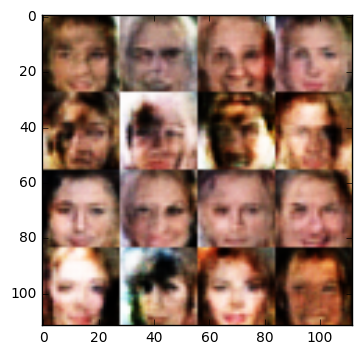

Epoch 1/1... Discriminator Loss: 0.5357... Generator Loss: 2.6358
Epoch 1/1... Discriminator Loss: 0.4378... Generator Loss: 5.2392
Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 3.6078
Epoch 1/1... Discriminator Loss: 0.3523... Generator Loss: 5.8496
Epoch 1/1... Discriminator Loss: 1.1748... Generator Loss: 0.6825
Epoch 1/1... Discriminator Loss: 0.6743... Generator Loss: 7.6458
Epoch 1/1... Discriminator Loss: 0.7456... Generator Loss: 1.5218
Epoch 1/1... Discriminator Loss: 0.3760... Generator Loss: 6.7810
Epoch 1/1... Discriminator Loss: 0.6786... Generator Loss: 1.6580
Epoch 1/1... Discriminator Loss: 0.3474... Generator Loss: 7.5618
Epoch 1/1... Discriminator Loss: 0.5087... Generator Loss: 2.4130
Epoch 1/1... Discriminator Loss: 0.3409... Generator Loss: 6.6476
Epoch 1/1... Discriminator Loss: 0.3994... Generator Loss: 3.4582
Epoch 1/1... Discriminator Loss: 0.3690... Generator Loss: 4.3252
Epoch 1/1... Discriminator Loss: 0.4776... Generator Loss: 2.5689
Epoch 1/1.

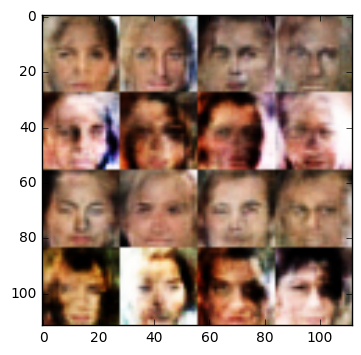

Epoch 1/1... Discriminator Loss: 0.3765... Generator Loss: 3.8736
Epoch 1/1... Discriminator Loss: 0.3745... Generator Loss: 4.6529
Epoch 1/1... Discriminator Loss: 0.3872... Generator Loss: 5.5595
Epoch 1/1... Discriminator Loss: 0.3969... Generator Loss: 3.7148
Epoch 1/1... Discriminator Loss: 0.4835... Generator Loss: 3.4783
Epoch 1/1... Discriminator Loss: 0.4027... Generator Loss: 4.2952
Epoch 1/1... Discriminator Loss: 0.4171... Generator Loss: 3.3552
Epoch 1/1... Discriminator Loss: 0.3918... Generator Loss: 4.9209
Epoch 1/1... Discriminator Loss: 0.3793... Generator Loss: 4.8229
Epoch 1/1... Discriminator Loss: 0.3811... Generator Loss: 4.1962
Epoch 1/1... Discriminator Loss: 0.3559... Generator Loss: 5.4708
Epoch 1/1... Discriminator Loss: 0.3577... Generator Loss: 4.5697
Epoch 1/1... Discriminator Loss: 0.3881... Generator Loss: 3.8059
Epoch 1/1... Discriminator Loss: 0.3857... Generator Loss: 4.3628
Epoch 1/1... Discriminator Loss: 0.5524... Generator Loss: 2.3115
Epoch 1/1.

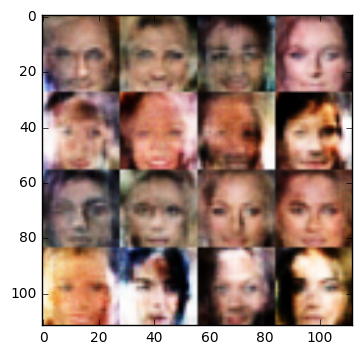

Epoch 1/1... Discriminator Loss: 0.4172... Generator Loss: 5.4715
Epoch 1/1... Discriminator Loss: 0.4185... Generator Loss: 4.1017
Epoch 1/1... Discriminator Loss: 0.5110... Generator Loss: 2.9113
Epoch 1/1... Discriminator Loss: 0.4037... Generator Loss: 5.9549
Epoch 1/1... Discriminator Loss: 0.3910... Generator Loss: 4.4888
Epoch 1/1... Discriminator Loss: 0.3962... Generator Loss: 3.9754
Epoch 1/1... Discriminator Loss: 0.3629... Generator Loss: 4.9577
Epoch 1/1... Discriminator Loss: 0.6335... Generator Loss: 1.9700
Epoch 1/1... Discriminator Loss: 0.7367... Generator Loss: 5.0667
Epoch 1/1... Discriminator Loss: 0.4034... Generator Loss: 5.9705
Epoch 1/1... Discriminator Loss: 0.4705... Generator Loss: 3.5410
Epoch 1/1... Discriminator Loss: 0.3901... Generator Loss: 4.4429
Epoch 1/1... Discriminator Loss: 0.4352... Generator Loss: 3.7618
Epoch 1/1... Discriminator Loss: 0.4530... Generator Loss: 3.7672
Epoch 1/1... Discriminator Loss: 0.3936... Generator Loss: 4.6308
Epoch 1/1.

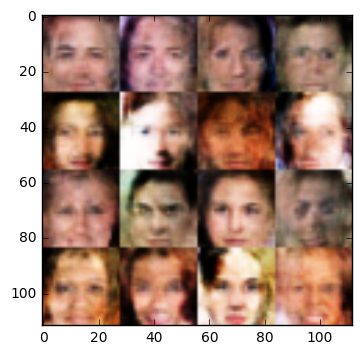

Epoch 1/1... Discriminator Loss: 0.3847... Generator Loss: 6.1426
Epoch 1/1... Discriminator Loss: 0.4108... Generator Loss: 3.3549
Epoch 1/1... Discriminator Loss: 0.4058... Generator Loss: 3.6524
Epoch 1/1... Discriminator Loss: 0.4212... Generator Loss: 3.6524
Epoch 1/1... Discriminator Loss: 0.3929... Generator Loss: 4.0408
Epoch 1/1... Discriminator Loss: 0.4257... Generator Loss: 3.9848
Epoch 1/1... Discriminator Loss: 0.3767... Generator Loss: 5.0060
Epoch 1/1... Discriminator Loss: 0.3776... Generator Loss: 4.0142
Epoch 1/1... Discriminator Loss: 0.3804... Generator Loss: 4.6892
Epoch 1/1... Discriminator Loss: 0.3430... Generator Loss: 6.0470
Epoch 1/1... Discriminator Loss: 0.3543... Generator Loss: 4.8770
Epoch 1/1... Discriminator Loss: 0.4433... Generator Loss: 3.6083
Epoch 1/1... Discriminator Loss: 0.3810... Generator Loss: 4.9302
Epoch 1/1... Discriminator Loss: 0.3824... Generator Loss: 4.0134
Epoch 1/1... Discriminator Loss: 0.3991... Generator Loss: 3.9586
Epoch 1/1.

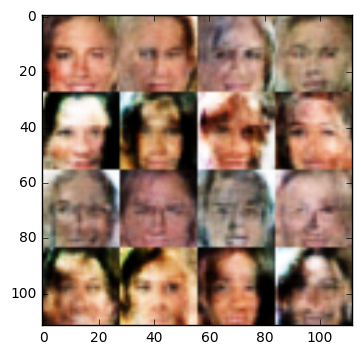

Epoch 1/1... Discriminator Loss: 0.4912... Generator Loss: 3.6528
Epoch 1/1... Discriminator Loss: 0.3741... Generator Loss: 6.8942
Epoch 1/1... Discriminator Loss: 0.4728... Generator Loss: 3.0584
Epoch 1/1... Discriminator Loss: 0.4840... Generator Loss: 3.3496
Epoch 1/1... Discriminator Loss: 0.3671... Generator Loss: 5.5996
Epoch 1/1... Discriminator Loss: 0.4187... Generator Loss: 3.4487
Epoch 1/1... Discriminator Loss: 0.4039... Generator Loss: 6.1344
Epoch 1/1... Discriminator Loss: 0.4063... Generator Loss: 3.5138
Epoch 1/1... Discriminator Loss: 0.3900... Generator Loss: 4.9055
Epoch 1/1... Discriminator Loss: 0.5412... Generator Loss: 2.4992
Epoch 1/1... Discriminator Loss: 0.4915... Generator Loss: 6.3514
Epoch 1/1... Discriminator Loss: 0.4148... Generator Loss: 4.0886
Epoch 1/1... Discriminator Loss: 0.3664... Generator Loss: 4.8553
Epoch 1/1... Discriminator Loss: 0.3568... Generator Loss: 5.4147
Epoch 1/1... Discriminator Loss: 0.3645... Generator Loss: 5.1436
Epoch 1/1.

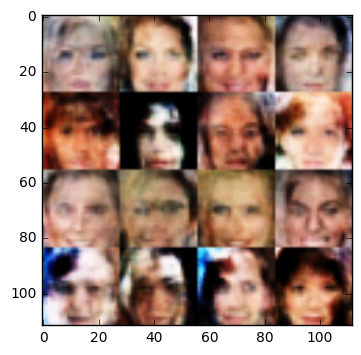

Epoch 1/1... Discriminator Loss: 0.6052... Generator Loss: 3.5111
Epoch 1/1... Discriminator Loss: 0.4143... Generator Loss: 5.0845
Epoch 1/1... Discriminator Loss: 0.4299... Generator Loss: 3.8447
Epoch 1/1... Discriminator Loss: 0.4331... Generator Loss: 3.1356
Epoch 1/1... Discriminator Loss: 0.3934... Generator Loss: 5.0656
Epoch 1/1... Discriminator Loss: 0.5051... Generator Loss: 2.4472
Epoch 1/1... Discriminator Loss: 0.4105... Generator Loss: 5.0711
Epoch 1/1... Discriminator Loss: 0.4000... Generator Loss: 3.8410
Epoch 1/1... Discriminator Loss: 0.3883... Generator Loss: 4.3219
Epoch 1/1... Discriminator Loss: 0.4186... Generator Loss: 4.8251
Epoch 1/1... Discriminator Loss: 0.4307... Generator Loss: 3.2471
Epoch 1/1... Discriminator Loss: 0.3730... Generator Loss: 5.6197
Epoch 1/1... Discriminator Loss: 0.3816... Generator Loss: 4.4981
Epoch 1/1... Discriminator Loss: 0.4193... Generator Loss: 3.9975
Epoch 1/1... Discriminator Loss: 0.3748... Generator Loss: 4.1938
Epoch 1/1.

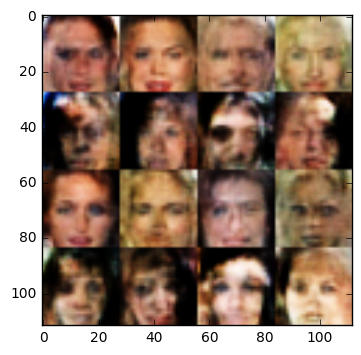

Epoch 1/1... Discriminator Loss: 0.3627... Generator Loss: 4.9451
Epoch 1/1... Discriminator Loss: 0.4653... Generator Loss: 3.2686
Epoch 1/1... Discriminator Loss: 0.3933... Generator Loss: 5.2350
Epoch 1/1... Discriminator Loss: 0.3949... Generator Loss: 4.3534
Epoch 1/1... Discriminator Loss: 0.3655... Generator Loss: 5.7995
Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 4.3515
Epoch 1/1... Discriminator Loss: 0.4373... Generator Loss: 3.2051
Epoch 1/1... Discriminator Loss: 0.3637... Generator Loss: 4.9306
Epoch 1/1... Discriminator Loss: 0.4440... Generator Loss: 3.8977
Epoch 1/1... Discriminator Loss: 0.3843... Generator Loss: 5.1535
Epoch 1/1... Discriminator Loss: 0.4202... Generator Loss: 3.7529
Epoch 1/1... Discriminator Loss: 0.4130... Generator Loss: 5.7937
Epoch 1/1... Discriminator Loss: 0.4503... Generator Loss: 3.6745
Epoch 1/1... Discriminator Loss: 0.4543... Generator Loss: 3.0745
Epoch 1/1... Discriminator Loss: 0.4993... Generator Loss: 5.5563
Epoch 1/1.

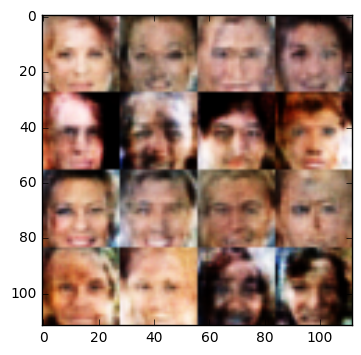

Epoch 1/1... Discriminator Loss: 0.4565... Generator Loss: 4.1877
Epoch 1/1... Discriminator Loss: 0.3803... Generator Loss: 6.2321
Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 3.3011
Epoch 1/1... Discriminator Loss: 0.4592... Generator Loss: 3.3009
Epoch 1/1... Discriminator Loss: 0.4196... Generator Loss: 5.1979
Epoch 1/1... Discriminator Loss: 0.3926... Generator Loss: 6.1108
Epoch 1/1... Discriminator Loss: 0.6047... Generator Loss: 2.1310
Epoch 1/1... Discriminator Loss: 0.5535... Generator Loss: 4.0479
Epoch 1/1... Discriminator Loss: 0.4627... Generator Loss: 4.6511
Epoch 1/1... Discriminator Loss: 0.4137... Generator Loss: 4.4704
Epoch 1/1... Discriminator Loss: 0.4217... Generator Loss: 3.9185
Epoch 1/1... Discriminator Loss: 0.3881... Generator Loss: 4.2782
Epoch 1/1... Discriminator Loss: 0.4682... Generator Loss: 3.3699
Epoch 1/1... Discriminator Loss: 0.3919... Generator Loss: 5.0636
Epoch 1/1... Discriminator Loss: 0.4945... Generator Loss: 3.1754
Epoch 1/1.

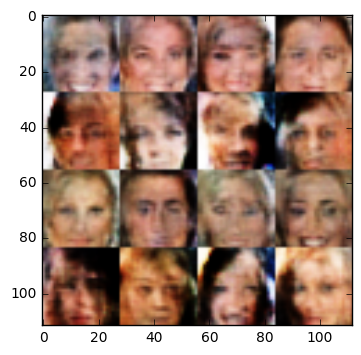

Epoch 1/1... Discriminator Loss: 0.4401... Generator Loss: 3.3749
Epoch 1/1... Discriminator Loss: 0.3572... Generator Loss: 5.6070
Epoch 1/1... Discriminator Loss: 0.5922... Generator Loss: 1.9579
Epoch 1/1... Discriminator Loss: 0.4367... Generator Loss: 3.9630
Epoch 1/1... Discriminator Loss: 0.4528... Generator Loss: 3.6274
Epoch 1/1... Discriminator Loss: 0.4430... Generator Loss: 4.6859
Epoch 1/1... Discriminator Loss: 0.6846... Generator Loss: 2.1881
Epoch 1/1... Discriminator Loss: 0.6575... Generator Loss: 5.5298
Epoch 1/1... Discriminator Loss: 0.3997... Generator Loss: 3.8985
Epoch 1/1... Discriminator Loss: 0.4864... Generator Loss: 3.7900
Epoch 1/1... Discriminator Loss: 0.4051... Generator Loss: 3.8414
Epoch 1/1... Discriminator Loss: 0.4027... Generator Loss: 5.0919
Epoch 1/1... Discriminator Loss: 0.4630... Generator Loss: 3.3162
Epoch 1/1... Discriminator Loss: 0.3865... Generator Loss: 4.0375
Epoch 1/1... Discriminator Loss: 0.4384... Generator Loss: 3.4245
Epoch 1/1.

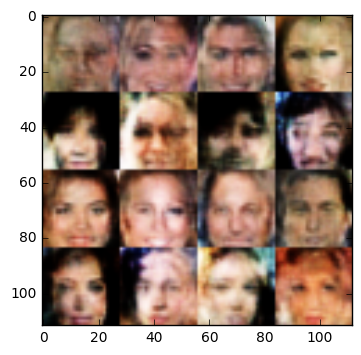

Epoch 1/1... Discriminator Loss: 0.9190... Generator Loss: 1.2024
Epoch 1/1... Discriminator Loss: 0.9158... Generator Loss: 1.5493
Epoch 1/1... Discriminator Loss: 0.5430... Generator Loss: 2.4424
Epoch 1/1... Discriminator Loss: 0.3722... Generator Loss: 4.6468
Epoch 1/1... Discriminator Loss: 0.6100... Generator Loss: 2.1635
Epoch 1/1... Discriminator Loss: 0.5734... Generator Loss: 2.8120
Epoch 1/1... Discriminator Loss: 0.4292... Generator Loss: 5.1709
Epoch 1/1... Discriminator Loss: 0.9059... Generator Loss: 1.2344
Epoch 1/1... Discriminator Loss: 0.8199... Generator Loss: 2.4836
Epoch 1/1... Discriminator Loss: 0.4571... Generator Loss: 2.5022
Epoch 1/1... Discriminator Loss: 0.4282... Generator Loss: 4.4588
Epoch 1/1... Discriminator Loss: 0.7294... Generator Loss: 1.8098
Epoch 1/1... Discriminator Loss: 0.5141... Generator Loss: 3.6017
Epoch 1/1... Discriminator Loss: 0.4811... Generator Loss: 3.0075
Epoch 1/1... Discriminator Loss: 0.4972... Generator Loss: 2.8483
Epoch 1/1.

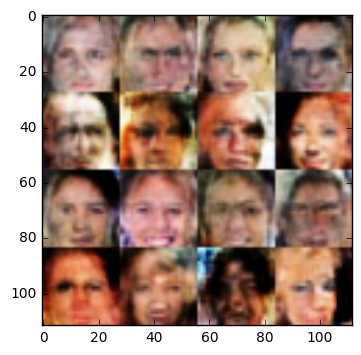

Epoch 1/1... Discriminator Loss: 0.4461... Generator Loss: 2.9539
Epoch 1/1... Discriminator Loss: 0.4811... Generator Loss: 3.5838
Epoch 1/1... Discriminator Loss: 0.4217... Generator Loss: 3.7685
Epoch 1/1... Discriminator Loss: 0.3786... Generator Loss: 5.2250
Epoch 1/1... Discriminator Loss: 0.3711... Generator Loss: 5.5937
Epoch 1/1... Discriminator Loss: 0.4543... Generator Loss: 3.1461
Epoch 1/1... Discriminator Loss: 0.4763... Generator Loss: 3.6434
Epoch 1/1... Discriminator Loss: 0.4828... Generator Loss: 3.3860
Epoch 1/1... Discriminator Loss: 0.7124... Generator Loss: 1.4738
Epoch 1/1... Discriminator Loss: 0.3774... Generator Loss: 6.4110
Epoch 1/1... Discriminator Loss: 0.5353... Generator Loss: 2.8647
Epoch 1/1... Discriminator Loss: 0.4897... Generator Loss: 2.9662
Epoch 1/1... Discriminator Loss: 0.4780... Generator Loss: 3.9962
Epoch 1/1... Discriminator Loss: 0.4068... Generator Loss: 3.9231
Epoch 1/1... Discriminator Loss: 0.5190... Generator Loss: 2.4076
Epoch 1/1.

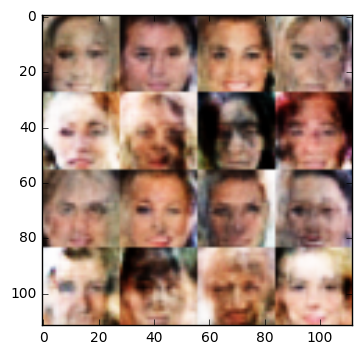

Epoch 1/1... Discriminator Loss: 0.6539... Generator Loss: 1.8636
Epoch 1/1... Discriminator Loss: 0.4491... Generator Loss: 4.5407
Epoch 1/1... Discriminator Loss: 0.4110... Generator Loss: 4.5784
Epoch 1/1... Discriminator Loss: 0.5666... Generator Loss: 2.4035
Epoch 1/1... Discriminator Loss: 0.5766... Generator Loss: 3.2285
Epoch 1/1... Discriminator Loss: 0.7447... Generator Loss: 1.5752
Epoch 1/1... Discriminator Loss: 0.5048... Generator Loss: 3.5268
Epoch 1/1... Discriminator Loss: 0.3751... Generator Loss: 6.2516
Epoch 1/1... Discriminator Loss: 0.5794... Generator Loss: 2.1219
Epoch 1/1... Discriminator Loss: 0.5920... Generator Loss: 2.5373
Epoch 1/1... Discriminator Loss: 0.6279... Generator Loss: 2.7103
Epoch 1/1... Discriminator Loss: 0.5119... Generator Loss: 2.5748
Epoch 1/1... Discriminator Loss: 0.7852... Generator Loss: 1.3332
Epoch 1/1... Discriminator Loss: 0.4660... Generator Loss: 4.3581
Epoch 1/1... Discriminator Loss: 0.7234... Generator Loss: 2.0372
Epoch 1/1.

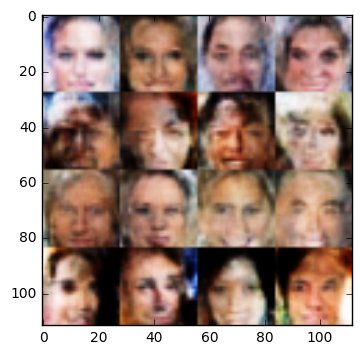

Epoch 1/1... Discriminator Loss: 0.5252... Generator Loss: 2.9785
Epoch 1/1... Discriminator Loss: 0.5102... Generator Loss: 5.0013
Epoch 1/1... Discriminator Loss: 0.4856... Generator Loss: 3.6886
Epoch 1/1... Discriminator Loss: 0.4121... Generator Loss: 5.2406
Epoch 1/1... Discriminator Loss: 0.4332... Generator Loss: 3.6289
Epoch 1/1... Discriminator Loss: 0.7215... Generator Loss: 2.8885
Epoch 1/1... Discriminator Loss: 0.5318... Generator Loss: 2.9741
Epoch 1/1... Discriminator Loss: 0.5553... Generator Loss: 3.0394
Epoch 1/1... Discriminator Loss: 0.6732... Generator Loss: 2.0555
Epoch 1/1... Discriminator Loss: 0.5492... Generator Loss: 3.8826
Epoch 1/1... Discriminator Loss: 0.4614... Generator Loss: 4.2550
Epoch 1/1... Discriminator Loss: 0.4939... Generator Loss: 3.4211
Epoch 1/1... Discriminator Loss: 0.5847... Generator Loss: 2.1543
Epoch 1/1... Discriminator Loss: 0.4482... Generator Loss: 5.0671
Epoch 1/1... Discriminator Loss: 0.3903... Generator Loss: 4.8871
Epoch 1/1.

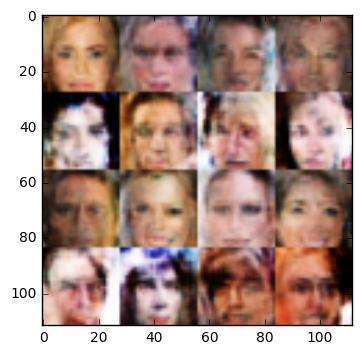

Epoch 1/1... Discriminator Loss: 2.0773... Generator Loss: 0.2765
Epoch 1/1... Discriminator Loss: 3.1242... Generator Loss: 5.0070
Epoch 1/1... Discriminator Loss: 2.4096... Generator Loss: 0.7875
Epoch 1/1... Discriminator Loss: 3.2688... Generator Loss: 4.6643
Epoch 1/1... Discriminator Loss: 2.3353... Generator Loss: 0.3239
Epoch 1/1... Discriminator Loss: 1.1003... Generator Loss: 2.2228
Epoch 1/1... Discriminator Loss: 2.8195... Generator Loss: 2.9136
Epoch 1/1... Discriminator Loss: 1.6237... Generator Loss: 0.8170
Epoch 1/1... Discriminator Loss: 1.1357... Generator Loss: 1.8736
Epoch 1/1... Discriminator Loss: 1.0567... Generator Loss: 1.2991
Epoch 1/1... Discriminator Loss: 1.9184... Generator Loss: 1.1346
Epoch 1/1... Discriminator Loss: 1.3372... Generator Loss: 1.5645
Epoch 1/1... Discriminator Loss: 0.7288... Generator Loss: 1.9531
Epoch 1/1... Discriminator Loss: 0.6511... Generator Loss: 2.5213
Epoch 1/1... Discriminator Loss: 0.7872... Generator Loss: 1.4564
Epoch 1/1.

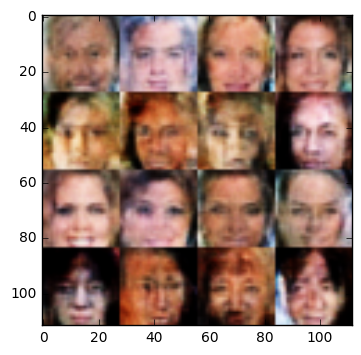

Epoch 1/1... Discriminator Loss: 0.4280... Generator Loss: 4.4140
Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 4.2227
Epoch 1/1... Discriminator Loss: 0.4216... Generator Loss: 3.1934
Epoch 1/1... Discriminator Loss: 0.6341... Generator Loss: 1.8123
Epoch 1/1... Discriminator Loss: 0.5243... Generator Loss: 4.0300
Epoch 1/1... Discriminator Loss: 0.4066... Generator Loss: 4.1841
Epoch 1/1... Discriminator Loss: 0.4826... Generator Loss: 3.4995
Epoch 1/1... Discriminator Loss: 0.4681... Generator Loss: 3.2381
Epoch 1/1... Discriminator Loss: 0.4089... Generator Loss: 4.3457
Epoch 1/1... Discriminator Loss: 0.5430... Generator Loss: 2.3126
Epoch 1/1... Discriminator Loss: 0.4768... Generator Loss: 3.2645
Epoch 1/1... Discriminator Loss: 0.5072... Generator Loss: 5.4208
Epoch 1/1... Discriminator Loss: 0.4634... Generator Loss: 3.3626
Epoch 1/1... Discriminator Loss: 0.4505... Generator Loss: 3.5324
Epoch 1/1... Discriminator Loss: 0.5657... Generator Loss: 2.7892
Epoch 1/1.

In [ ]:
batch_size = 16
z_dim = 128
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.